In [2]:
import pandas as pd
from pandas import read_csv, DataFrame, to_timedelta, to_datetime, concat, date_range, Series
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar
import numpy as np
from numpy import arange, sqrt, float64, nan
from datetime import date
from time import time
import matplotlib.pyplot as plt
from matplotlib.dates import WeekdayLocator
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import matplotlib.dates as dates
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.iolib.smpickle import load_pickle
from scipy.optimize import curve_fit
from scipy.stats import ttest_ind
#from fbprophet import Prophet
import os

# Install prophet using Anaconda: conda install -c conda-forge fbprophet

# Project Details

## Investigator name: Natalia Ruiz Juri
### Department: Center for Transportation Research

## Title: Understanding typical traffic conditions using traffic sensors

### Project Description

TxDOT uses different types of sensors to capture traffic speeds and volumes every few minutes. The data may be used to quantify the impacts of lane closures by computing delays. In order to estimate delays it is necessary to understand what typical speeds and volumes are.

### Technical Objectives / Hypotheses

The goal of this task is to develop a method to estimate typical 15-minute speed and volumes at the locations where sensors are deployed, considering that some of the collected data is not representative because it corresponds to incidents or lane closures. There are also data errors (missing reads or unreliable reads). There may be different typical values by weekday, and also for different seasons, although it’s not clear how many typical values are needed. As second goal may be to compare the data for two different types of sensors at the same location, to understand if there are significant differences.

### Desired Deliverables

Method to estimate typical speeds and volumes using sensor data, and corresponding estimates for 3 sensors. Assessment of desired aggregation for the metric to account for variation within the day, between weekdays, and across months of the year). Assessment of whether there is a significant difference in the computed metrics depending of the type of sensor used to obtain the data.

### The problem was addressed in 5 main steps:

1. Data exploration: Includes data visualisations from three sensors located in various places in I-35 North (south bound). This includes the weekday/weekend and holiday vs business day comparisons for both speed and volume data.
2. Periodicity: Analyzing the periodicity in the data and repeatability of the trends in comparable times (for instance, each monday morning provides very similar trends and values for both speed and volume, if it is not a national holiday).
3. Outlier elimination: Eliminating missing data points, or the periods where late night slowdowns were observed due to road construction events.
4. Hypothesis testing: Using t-statistics to quantify the statistical significance on the difference of fridays from other weekdays (monday, tuesday, wednesday and thursday).
5. Modeling: Various modeling approaches were tested to provide a good fit to the data (sarimax time series modeling, curve fitting using polynomial regressions, prophet modeling).

All analysis were performed using Python Jupyter Notebook, using an original dataset extracted from SQL (`sensor_data.csv`). Please include the csv file in the same directory as this notebook.

# 1. Data Exploration

In this section, we analyze data visualisations of three sensors located in places on a section I-35 southbound near Rundberg Lane.

Start by creating new directories for plots and for some derived datasets from the original data

In [3]:
# detect the current working directory and print it
currentpath = os.getcwd()
print ("The current working directory is %s" % currentpath)
# define the name of the directory to be created
newpaths = ["/derived_data"]

for path in newpaths:
    path = currentpath + path
    try:
        os.mkdir(path)
    except OSError:
        print ("Creation of the directory %s failed (this might be because the directory already exists)" % path)
    else:
        print ("Successfully created the directory %s " % path)

The current working directory is /Volumes/GoogleDrive/My Drive/Fall 2020/Lectures/Consulting Seminar
Successfully created the directory /Volumes/GoogleDrive/My Drive/Fall 2020/Lectures/Consulting Seminar/derived_data 


Seperate data into one DataFrame per sensor, where

* `sensor1 = 'SB I-35 MM 4 before NB US 183 Flyover'`
* `sensor2 = 'SB I-35 MM 5 after Rundberg Ln'`
* `sensor3 = 'SB I-35 MM 6 before E Rundberg Ln'`

Also returns the name of 3 sensors as strings (sensor1, sensor2, sensor3).

In [3]:
def arrange_data(filename):
    df = pd.read_csv(filename, usecols = ['sensor_name','date_day','hour','from_minute','volume','speed'])
    df.loc[:,'Date'] = pd.to_datetime(df.date_day.astype(str)+' '+df.hour.astype(str) + ':' + df.from_minute.astype(str))
    df = df.drop(columns=['date_day', 'hour','from_minute'])

    sensor1 = 'SB I-35 MM 4 before NB US 183 Flyover'
    sensor2 = 'SB I-35 MM 5 after Rundberg Ln'
    sensor3 = 'SB I-35 MM 6 before E Rundberg Ln'

    #Seperate the data into three different dataframes in order to be able to analyze them separately
    df1 = df[df['sensor_name']==sensor1].reset_index(drop=True)
    df2 = df[df['sensor_name']==sensor2].reset_index(drop=True)
    df3 = df[df['sensor_name']==sensor3].reset_index(drop=True)

    for dfi in [df1, df2, df3]:
        dfi.drop('sensor_name', axis=1, inplace=True)
    
    df1 = df1.set_index('Date')
    df2 = df2.set_index('Date')
    df3 = df3.set_index('Date')
    
    for i,df in enumerate([df1, df2, df3]):
        df.to_pickle(f'derived_data/df{i+1}.pkl')
        df.to_csv(f'derived_data/df{i+1}.csv')

    pd.concat([df1.describe(), df2.describe(), df3.describe()], axis=1)
    return df1,df2,df3, sensor1, sensor2, sensor3

df1, df2, df3, sensor1, sensor2, sensor3 = arrange_data(filename='sensor_data.csv')
df1.head()

,volume,speed
Date,,
2019-02-25 07:45:00,1094,19
2019-02-25 08:00:00,1078,17
2019-02-25 08:15:00,1010,13
2019-02-25 08:30:00,1015,16
2019-02-25 08:45:00,1035,26


This first plot is the annual speed data from sensor SB I-35 MM 4 before NB US 183 Flyover.

The speed data floats around a constant value of 60 mph, the speed limit at that sensor location. The speed appears to decrease periodically.

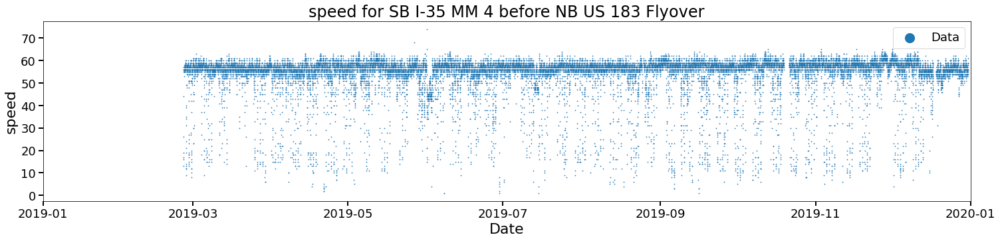

In [4]:
def plots(df, sensor, field='speed', date_range=[date(2019, 2, 26), date(2019, 3, 4)], alldata="no", annual ="yes", s=0.5):
    '''Generate various time-series visuals to explore the data, which includes for speed and volume information from all sensors, and also holidays.'''
    
    alpha = 0.9
    plt.figure(figsize=[25,5])
    
    ax = plt.axes()
    
    if alldata == "yes":
        ax.scatter(df1.index, df1[field], s=s, alpha=alpha, label=sensor1)
        ax.scatter(df2.index, df2[field], s=s, alpha=alpha, label=sensor2)
        ax.scatter(df3.index, df3[field], s=s, alpha=alpha, label=sensor3)
        ax.set_title(f'{field} for all 3 sensors')
        
    elif alldata == "no":
        ax.scatter(df.index, df[field], s=s, label = "Data")
        ax.set_title(f'{field} for {sensor}{"" if annual else f" from {date_range[0]} to {date_range[1]}"}')
        
    if annual == "yes":
        ax.set_xlim([date(2019, 1, 1), date(2020, 1, 1)])
        
    elif annual == "no":
        ax.set_xlim(date_range)
        
    ax.tick_params(axis='both', which='major')
    ax.set_xlabel('Date')
    ax.set_ylabel(field)
 
    if s==0.5:
        n = 20
    else:
        n = 5

    ax.legend()
    ax.title.set_size(24)
    ax.xaxis.label.set_size(22)
    ax.yaxis.label.set_size(22)
    plt.legend(loc=1, prop={'size': 18}, markerscale=n)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=7)
    
    plt.xticks(size = 18)
    plt.yticks(size = 18)
    plt.show()

plots(df1, sensor1, field='speed', alldata="no", annual ="yes")

This the annual volume data from sensor SB I-35 MM 4 before NB US 183 Flyover. It appears that the volume data is more noisy compared to the speed data.

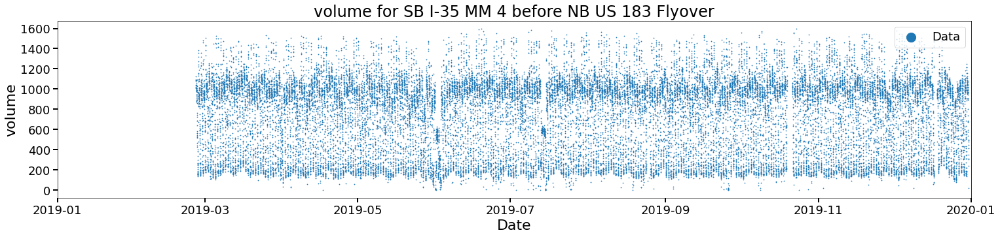

In [5]:
plots(df1, sensor1, field='volume', alldata="no", annual ="yes")

This third plot is the annual speed data from sensor SB I-35 MM 5 after Rundberg Ln. The speed data seems to generally float around 65-70 mph, with the speed limit at this location being 70 mph. Slower speeds are likely attributed to temporary speed limit changes in the area.

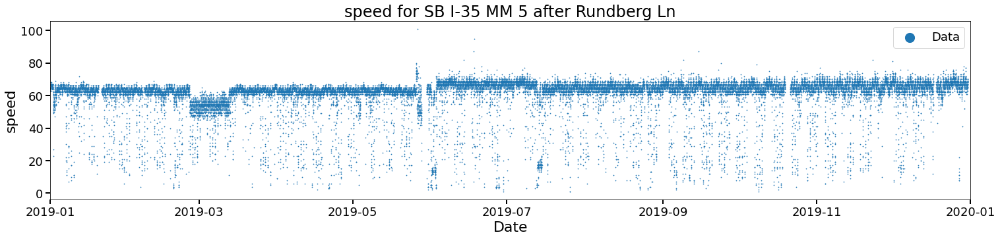

In [6]:
plots(df2, sensor2, field='speed', alldata="no", annual ="yes")

The fourth plot is the annual volume data from sensor SB I-35 MM 5 after Rundberg Ln. Like with the last sensor, the volume data is noisier than the speed data.

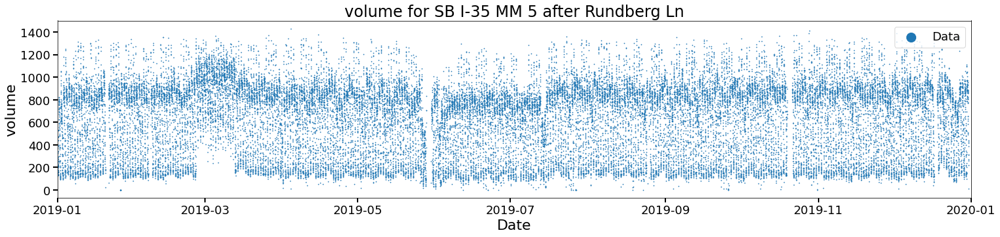

In [7]:
plots(df2, sensor2, field='volume', alldata="no", annual ="yes")

Next, the annual speed data from sensor SB I-35 MM 6 before before Rundberg Ln. Again, speeds generally stick around the speed limit of 70 mph.

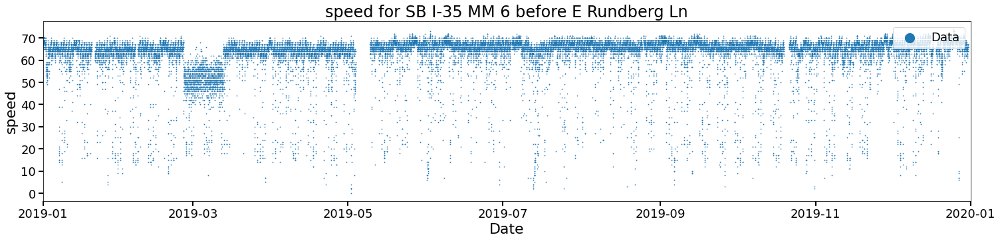

In [8]:
plots(df3, sensor3, field='speed', alldata="no", annual ="yes")

This plots the annual volume data from sensor SB I-35 MM 6 before E Rundberg Ln. Again, it resembles prior sensors.

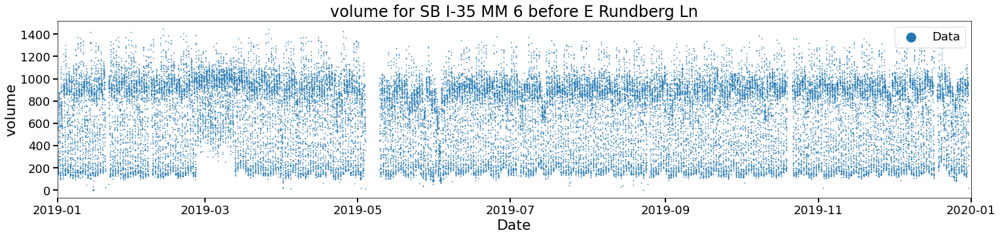

In [9]:
plots(df3, sensor3, field='volume', alldata="no", annual ="yes")

Comparing speeds from all three sensors, we see that the values in SB I-35 MM 5 (orange) and SB I-35 MM 6 (green) mostly match each other. There are certain instances where the data is moving around 60 mph for these two sensors (in the beginning of March), which we suspect is due to a temporary speed change. The data from Sensor SB I-35 MM 4 stays at a lower 60 mph, the speed limit in that area due to ongoing construction.

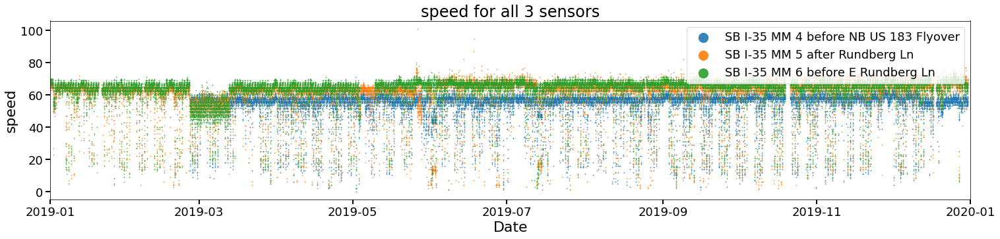

In [10]:
plots(df3, sensor3, field='speed', alldata="yes", annual ="yes")

Volume data from all three sensors are mostly matching each other, even though the traffic flows at different speeds. This is mainly because the sensors are located very close to each other and the traffic volume is not impacted by the changes in speed limits. 

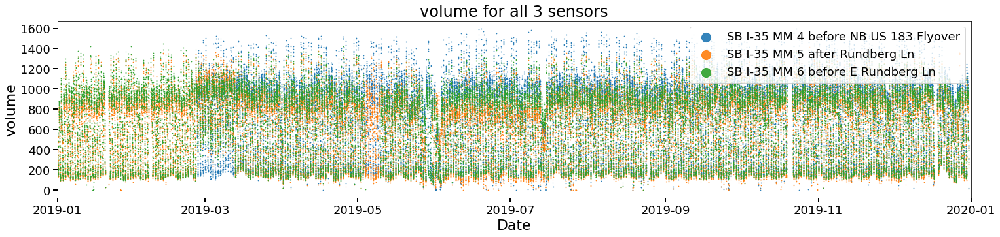

In [11]:
plots(df3, sensor3, field='volume', alldata="yes", annual ="yes")

Zooming into the speed and volume data, we see there's a periodic slowdown in the speed during morning rush hours (between 6AM-10AM). This is illustrated in below figure from February 26th to March 4th, a representative work week.

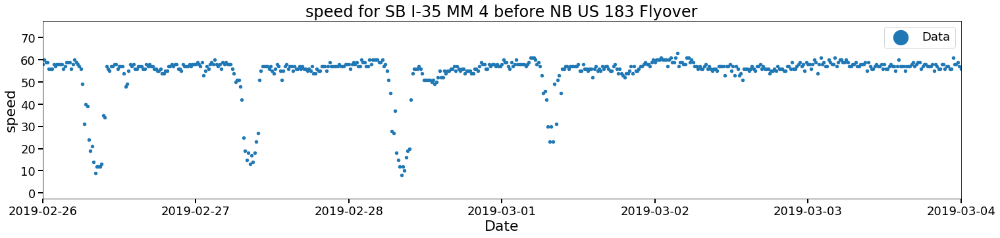

In [12]:
plots(df1, sensor1, field='speed', alldata="no", annual ="no", s=20)

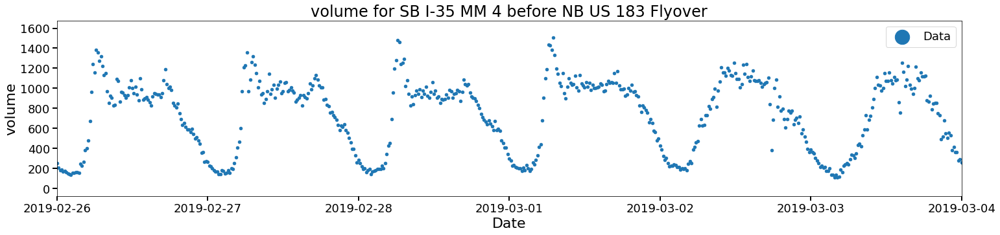

In [13]:
plots(df1, sensor1, field='volume', alldata="no", annual ="no", s=20)

However, the trends in the speed data are different when we look at the holiday times. Below is an example from Memorial Day (Monday 5/27), plotted one week before through the week of the holiday. The morning rush disappears on Monday 27th since not many people are driving on a holiday. 

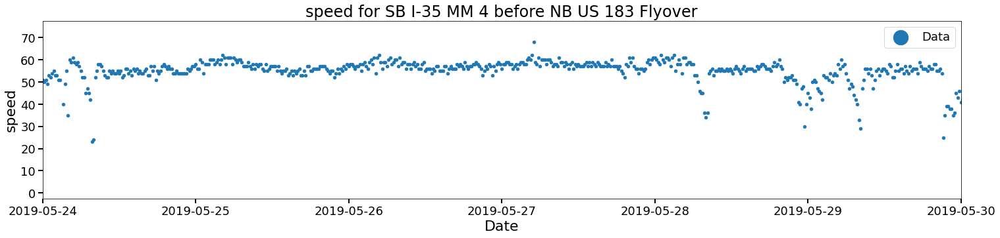

In [14]:
plots(df1, sensor1, field='speed', alldata="no", annual ="no", s=20, date_range=[date(2019, 5, 24), date(2019, 5, 30)])

Similarly, the trends in the volume data are also different when we look at holidays. Taking Memorial Day again, we see that the traffic volume decreases significantly on Monday 27th since not many people are driving on a holiday.

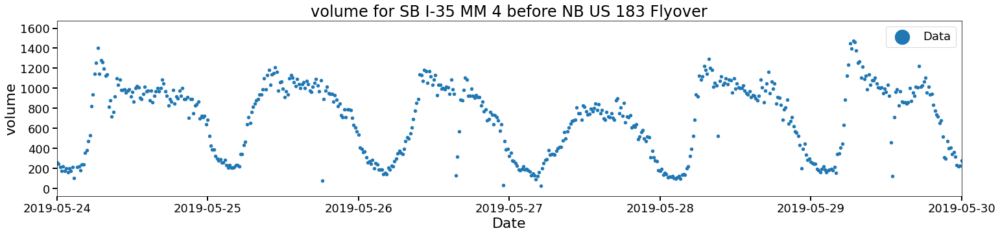

In [15]:
plots(df1, sensor1, field='volume', alldata="no", annual ="no", s=20, date_range=[date(2019, 5, 24), date(2019, 5, 30)])

For another example, take Independence Day. Since July 4th, 2019 was on a Thursday, it appears that the morning rush disappeared on both Thursday and Friday (and that we have some missing data during Independence Day, perhaps due to the sensors being offline). 

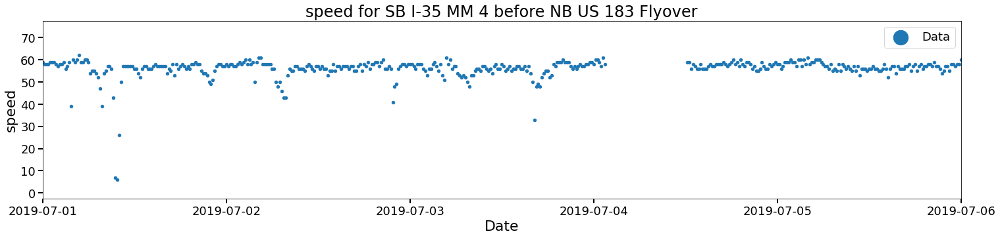

In [16]:
plots(df1, sensor1, field='speed', alldata="no", annual ="no", s=20, date_range=[date(2019, 7, 1), date(2019, 7, 6)])

Likewise, traffic volumes also decreased on July 4th and July 5th. 

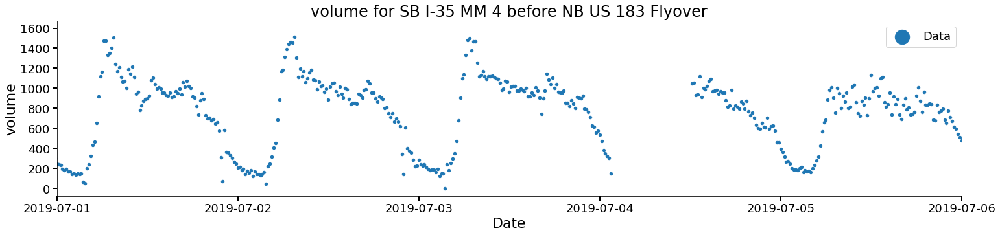

In [17]:
plots(df1, sensor1, field='volume', alldata="no", annual ="no", s=20, date_range=[date(2019, 7, 1), date(2019, 7, 6)])

For a third example, the morning rush also disappeared on Labor Day (9/2), visible in both speed and volume. 

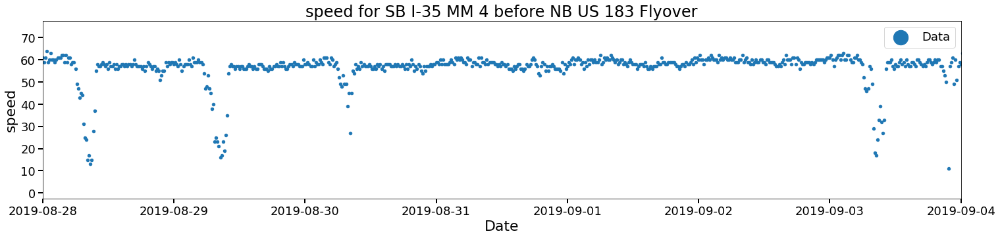

In [18]:
plots(df1, sensor1, field='speed', alldata="no", annual ="no", s=20, date_range=[date(2019, 8,28), date(2019, 9, 4)])

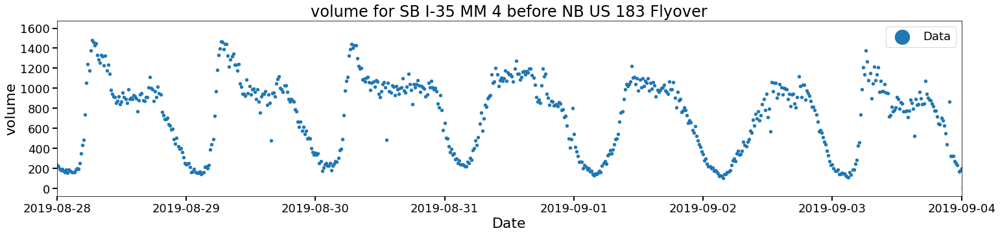

In [19]:
plots(df1, sensor1, field='volume', alldata="no", annual ="no", s=20, date_range=[date(2019, 8, 28), date(2019, 9, 4)])

We see the same story on Thanksgiving (11/28) and to a lesser extent on Black Friday. 

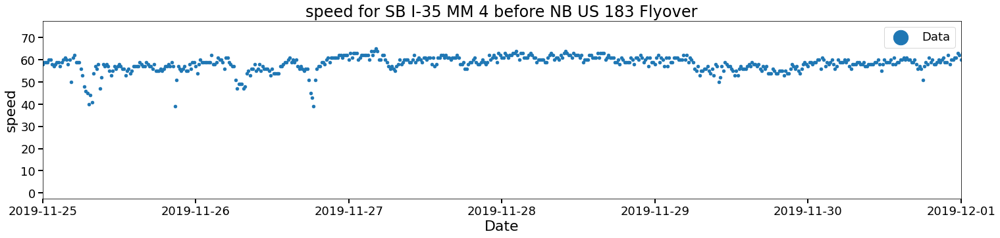

In [20]:
plots(df1, sensor1, field='speed', alldata="no", annual ="no", s=20, date_range=[date(2019, 11, 25), date(2019, 12, 1)])

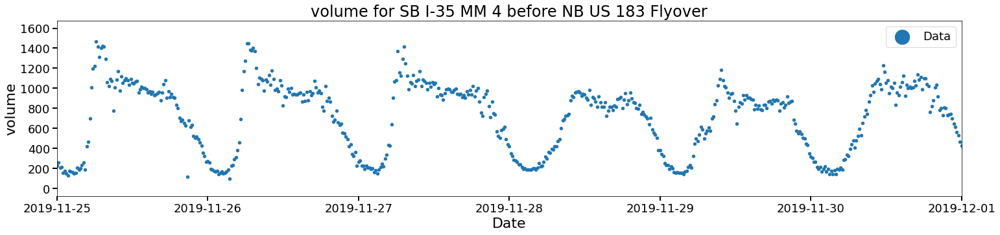

In [21]:
plots(df1, sensor1, field='volume', alldata="no", annual ="no", s=20, date_range=[date(2019, 11, 25), date(2019, 12, 1)])

Finally, Christmas sees a prolonged decrease in traffic volumes, with many people taking a long holiday and speeds staying more-or-less constant over the entire week.

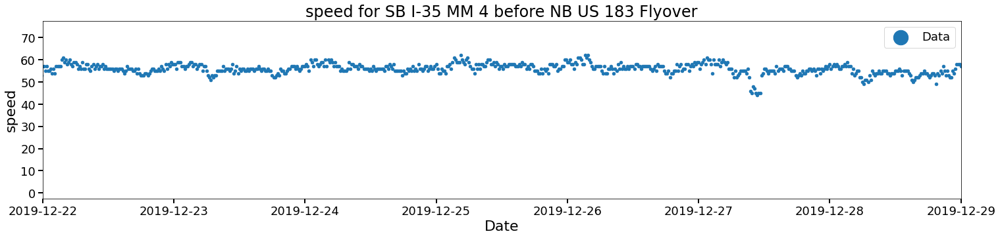

In [22]:
plots(df1, sensor1, field='speed', alldata="no", annual ="no", s=20, date_range=[date(2019, 12, 22), date(2019, 12, 29)])

The volume data around Christmas is more interesting. They're lower than usual values observed during work weeks: typically morning rush volume reaches around 1500, but during the Christmas week it peaks at around 1000-1100. 

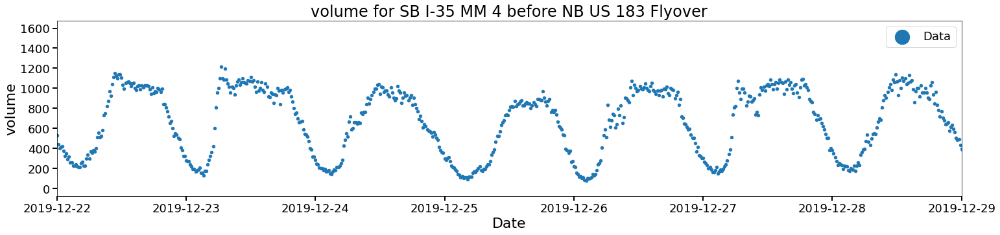

In [23]:
plots(df1, sensor1, field='volume', alldata="no", annual ="no", s=20, date_range=[date(2019, 12, 22), date(2019, 12, 29)])

# 2. Periodicity Analysis

In this section we analyze periodicity in the data and repeatability of trends in comparable timeframes, e.g., if Monday mornings exhibit similar trends and values for both speed and volume.

In [24]:
def weekly(df, sensor, field='speed'):
    '''Visualizes the dataset over weekly intervals, overlapping weeks on top of each other.'''

    deltas = df.index - pd.to_datetime(date(2018, 12, 30))
    week = deltas.days // 7
    d = pd.Series(df[field].values,
                  [deltas - pd.to_timedelta(week, 'w'), week])
    d = d.unstack().add_prefix('Week ')

    plt.figure(figsize=[25,5])
    ax = plt.axes()
    secs = d.index.total_seconds()
    for i,column in enumerate(d.columns):
        i = i/d.columns.shape[0]
        ax.plot(secs, d[column], alpha=.5, color=plt.cm.cividis(i), label=column)


    ax.set_xlabel('Day of Week')
    ax.set_ylabel(field)
    ax.set_title(f'Weekly {field} values for {sensor}')

    ax.title.set_size(24)
    ax.xaxis.label.set_size(24)
    ax.yaxis.label.set_size(24)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=7)
    plt.xticks(size = 20)
    plt.yticks(size = 20)
    
    ax.set_xlim((secs.min(), secs.max()))
    ax.set_ylim((0,80))

    ax.set_xticks([86400*i for i in range(8)])
    ax.set_xticklabels(['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])

def daily(df, sensor, field='speed', filter_by='daily'):
    '''Visualizes the dataset over daily intervals, overlapping days on top of each other to compare weekdays with each other.'''

    deltas = df.index - pd.to_datetime(date(2018, 12, 30))
    weekday = deltas.days % 7
    plt.figure(figsize=[25,5])
    
    ax = plt.axes()
    def helper(df, deltas, weekday, filter_by='daily', plot_i=None):
        if filter_by == 'weekday':
            filter = (weekday != 0) & (weekday != 6)
        elif filter_by == 'weekend':
            filter = (weekday == 0) | (weekday == 6)
        elif filter_by == 'friday':
            filter = (weekday == 5)
        elif filter_by == 'mon-thu':
            filter = (weekday != 0) & (weekday != 5) & (weekday != 6)
        elif filter_by == 'daily':
            filter = (weekday == weekday)
        else:
            raise ValueError('Invalid filter_by')
        df = df.loc[filter, [field]]
        deltas = deltas[filter]
        days = pd.to_timedelta(deltas.days, 'd')
        d = pd.Series(df[field].values,
                    [deltas - days, days])
        d = d.unstack()
        secs = d.index.total_seconds()
        for i,column in enumerate(d.columns):
            i = i/d.columns.shape[0]
            if plot_i is None:
                ax.plot(secs, d[column], alpha=.5, color=plt.cm.cividis(i))
            else:
                cmap = plt.get_cmap("tab10")
                ax.plot(secs, d[column], alpha=.5, color=cmap(plot_i), label=filter_by if (i == 0) else None)
                
        return secs

    if isinstance(filter_by, list):
        for i,fb in enumerate(filter_by):
            secs = helper(df, deltas, weekday, fb, plot_i=i)
        ax.legend()
    else:
        secs = helper(df, deltas, weekday, filter_by)

    ax.set_xlabel('Hour')
    ax.set_ylabel(field)
    ax.set_title(f'{filter_by} {field} values for {sensor}')

    ax.title.set_size(24)
    ax.xaxis.label.set_size(22)
    ax.yaxis.label.set_size(22)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=7)
    plt.xticks(size = 18)
    plt.yticks(size = 18)
    
    ax.set_xlim((secs.min(),secs.max()))
    ax.set_ylim((0,80))

    ax.set_xticks([3600*i for i in range(25)])
    ax.set_xticklabels(list(range(24))+[0])
    
    if filter_by==['mon-thu', 'friday']:
        plt.legend(loc=1, prop={'size': 20}, markerscale=20)

def speed_boxes(df, sensor, field='speed'):
    '''Visualize boxplots of speed data for each day.'''

    deltas = df.index - pd.to_datetime(date(2018, 12, 30))
    weekday = deltas.days % 7
    df_chart = df.copy()
    df_chart['day of week'] = weekday
    ax = df_chart.boxplot(field, by='day of week', figsize=(10,5))
    ax.set_ylabel('Speed (mph)')
    ax.set_xticklabels(['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
    plt.show()

def count_late_night_slowdowns(df, sensor, speed_threshold=50, slow_intervals=4):
    '''Generate a bar chart showing the number of late night slowdowns each month.'''

    deltas = df.index - pd.to_datetime(date(2018, 12, 30))
    weekday = deltas.days % 7
    filter = (weekday != 0) & (weekday != 6)
    df = df.loc[filter, ['speed']]
    deltas = deltas[filter]
    days = pd.to_timedelta(deltas.days, 'd')
    d = pd.Series(df['speed'].values,
                [deltas - days, days])
    d = d.unstack()
    # Filter for late night peak
    d = d.iloc[(20*4):,]
    # Count 15-min intervals with significant slowdown by day
    slowdowns = (d < speed_threshold).sum(axis=0)
    # If there are a significant number of late night slowdown
    slowdowns = slowdowns[slowdowns > slow_intervals]
    slowdowns_by_month = (slowdowns.index.days // 30 + 1).value_counts().sort_index()
    plt.bar(slowdowns_by_month.index, slowdowns_by_month)
    plt.xticks(np.arange(min(slowdowns_by_month.index), max(slowdowns_by_month.index)+1, 1.0))
    plt.title(f'Late night slowdown weekdays for\n{sensor}')
    plt.xlabel('Month')
    plt.ylabel('Number of weekdays')
    plt.show()

### Sensor 1

The below figure illustrates overlapped data for the days of the week, where color represents a different week from the year (bluer colors are earlier, yellower is later). We observe that there's strong periodicity in speeds week-to-week, but that there also appear to be sporadic, unexplained slowdowns during late nights some months of the year. We speculate that they might be attributed to temporary road closures for construction on I-35, but we don't know for sure.

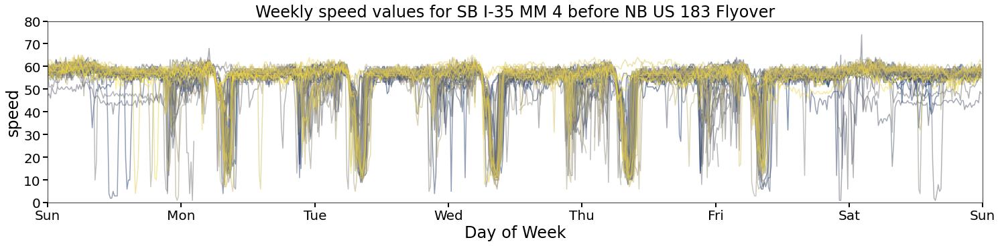

In [25]:
weekly(df1, sensor1)

Narrowing the periodicity to overlap daily speed readings, we see two strong trends from 6AM to 10AM: flat speeds (weekends) and a slowdown due to the morning rush. 

On some days we see slowdowns starting at around 9PM through midnight, but the trend isn't as strong as the one for the morning rush.

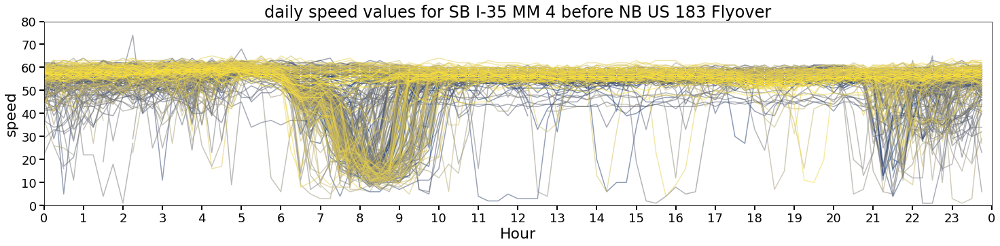

In [26]:
daily(df1, sensor1)

Looking only at weekdays, we see that the straight line morning trend thins out but does not disappear (likely due to holidays), but that the morning rush dip comprises the bulk of readings between 6 and 10 am. 

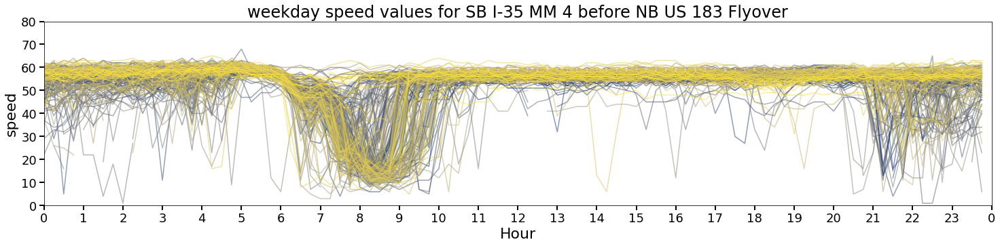

In [27]:
daily(df1, sensor1, filter_by='weekday')

Filtering for Fridays only and then comparing to Monday through Thursday only in the next two charts, we see that Friday is similar to the other weekdays, but it does look different enough to justify further analysis.

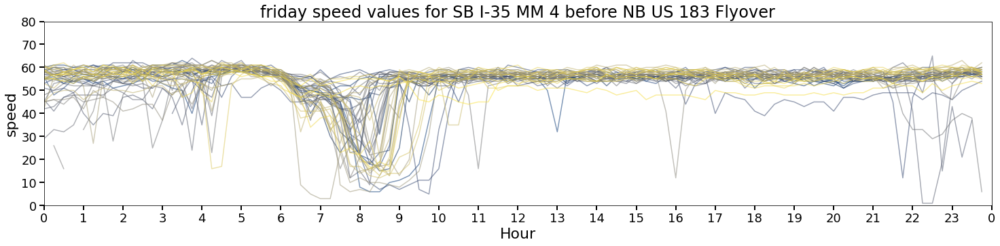

In [28]:
daily(df1, sensor1, filter_by='friday')

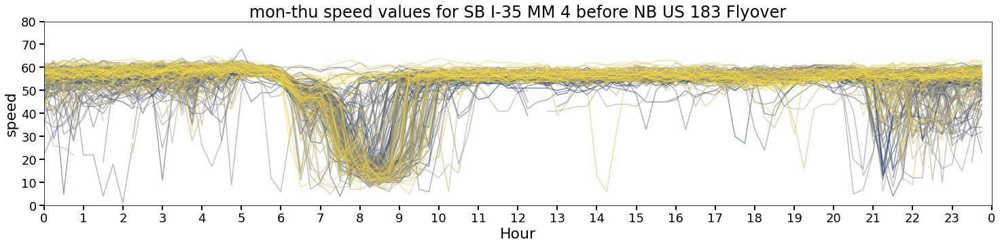

In [29]:
daily(df1, sensor1, filter_by='mon-thu')

Finally, for weekends we see that speeds stay close to the limit through the weekend; no morning rush.

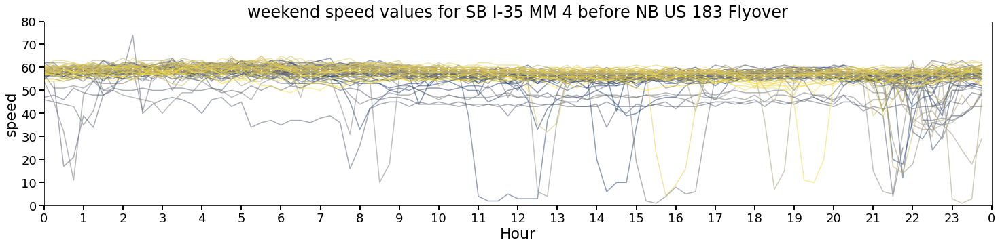

In [30]:
daily(df1, sensor1, filter_by='weekend')

Comparing Fridays (orange) to other weekdays (blue) directly, we migth be able to argue that Friday slowdowns are not as extreme as other weekdays. On Fridays we see the speeds dropping to a low value of around 20 mph at 8:30 AM, but this value is closer to 10 mph for other weekdays. This motivates hypothesis testing whether speeds on Fridays are significantly different from speeds on other weekdays. 

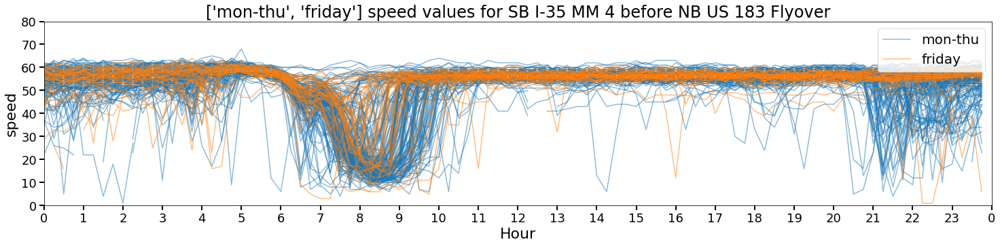

In [31]:
daily(df1, sensor1, filter_by=['mon-thu', 'friday'])

Below are the speed boxplots for each weekday.

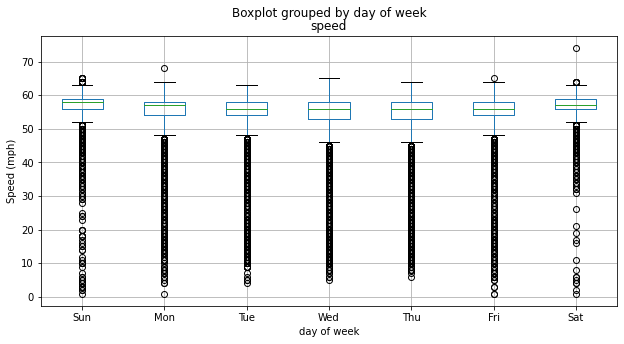

In [32]:
speed_boxes(df1, sensor1)

Although we initially suspected that late night slowdowns would be concentrated in a specific part of the year due to seasonal construction, based on the late night slowdown bar chart this doesn't seem to be the case.

(For the purposes of this analysis, we define a day as having a late night slowdown if it reports speeds lower than 50 mph for more than four 15-minute periods between 8 pm and 12 am.)

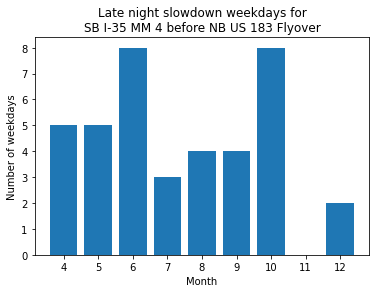

In [33]:
count_late_night_slowdowns(df1, sensor1)

### Sensor 2
We performed the same analysis on the other sensors in our dataset and drew conclusions similar to those we found on sensor 1.

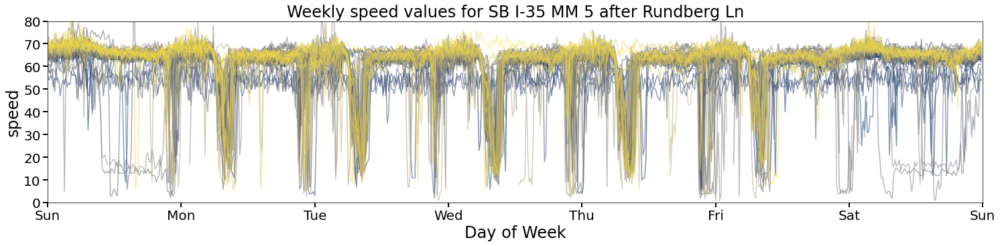

In [34]:
weekly(df2, sensor2)

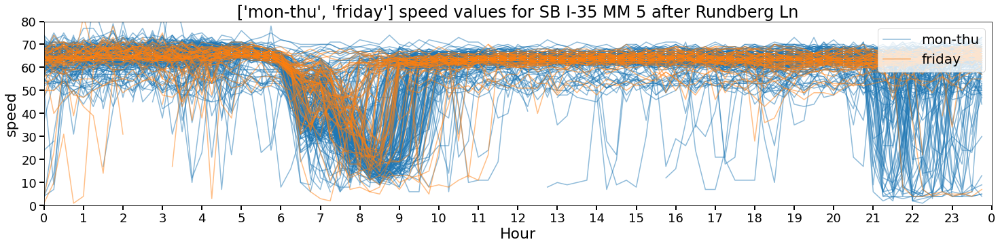

In [35]:
daily(df2, sensor2, filter_by=['mon-thu', 'friday'])

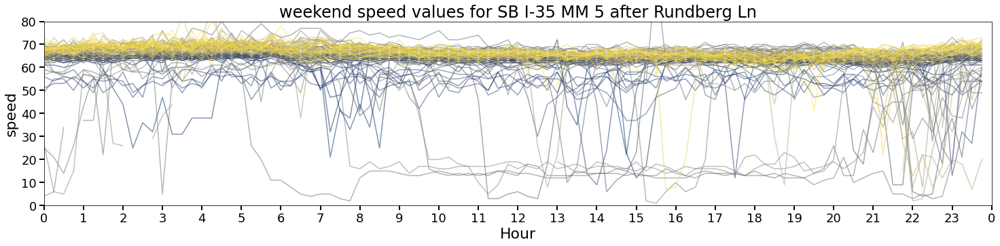

In [36]:
daily(df2, sensor2, filter_by='weekend')

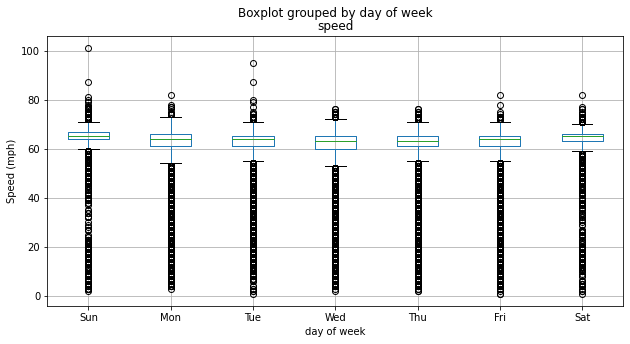

In [37]:
speed_boxes(df2, sensor2)

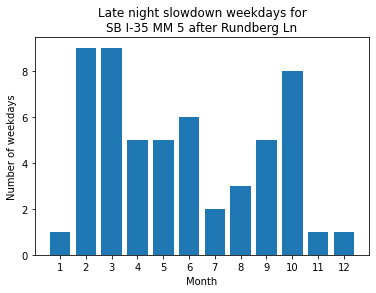

In [38]:
count_late_night_slowdowns(df2, sensor2, speed_threshold=60)

### Sensor 3

We note that late night slowdowns are much less common at this sensor, for no discernable reason.

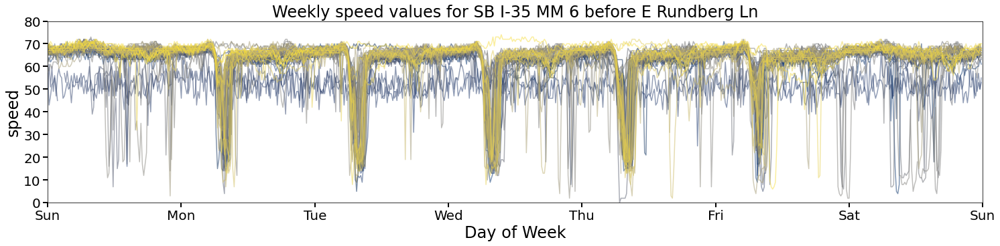

In [39]:
weekly(df3, sensor3)

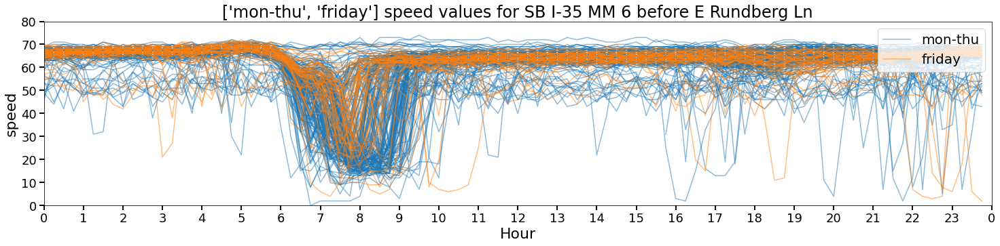

In [40]:
daily(df3, sensor3, filter_by=['mon-thu', 'friday'])

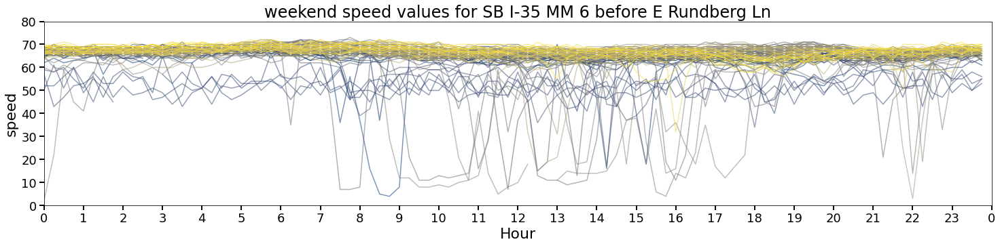

In [41]:
daily(df3, sensor3, filter_by='weekend')

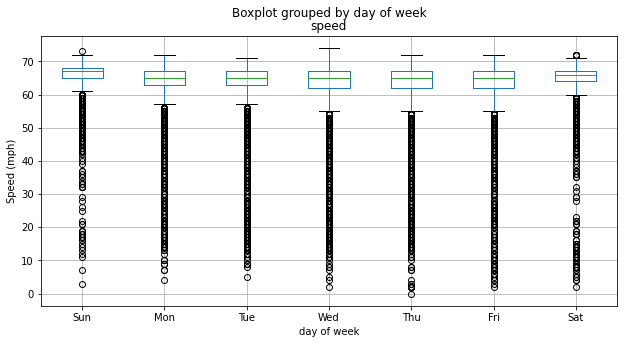

In [42]:
speed_boxes(df3, sensor3)

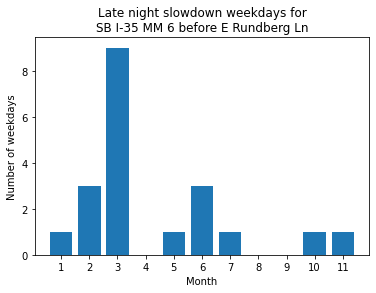

In [43]:
count_late_night_slowdowns(df3, sensor3, speed_threshold=60)

# 3. Outlier Elimination

Before modeling, we need to remove unrepresentative trends and other obvious outliers. To do so, we: 

1. Eliminate timestamps based on speed, i.e., if we decide to remove a speed entry, we will remove the corresponding volume entry too.
2. Eliminate every entry more than 5 mph above the speed limit.
3. Eliminate every day with at least 25% of off-peak readings more than 10 mph below the speed limit.

The first rule is due to the fact that speed and volumes come from the same sensor, and anomalous speeds are easier to determine than volumes. For the second, although speeds much larger than the speed limit do occasionally happen (perhaps late at night when there's little traffic), as a rule we don't want those influencing our typical speed model. Finally, the third rule addresses the anomalous late-night slowdowns we identified earlier.

## Eliminate every entry more than 5 mph above the speed limit.

In [44]:
dfs = (pd.read_pickle('derived_data/df1.pkl'),
       pd.read_pickle('derived_data/df2.pkl'),
       pd.read_pickle('derived_data/df3.pkl'))

dfs_original = tuple([df.copy() for df in dfs])

sensor_names = ('SB I-35 MM 4 before NB US 183 Flyover',
                'SB I-35 MM 5 after Rundberg Ln',
                'SB I-35 MM 6 before E Rundberg Ln')

speed_limits = (60, 70, 70)

dfs[0].head()

,volume,speed
Date,,
2019-02-25 07:45:00,1094,19
2019-02-25 08:00:00,1078,17
2019-02-25 08:15:00,1010,13
2019-02-25 08:30:00,1015,16
2019-02-25 08:45:00,1035,26


In [45]:
for i in range(len(dfs)):
    print(f'{sensor_names[i]} before: {len(dfs[i])}')
    dfs[i].drop(dfs[i].index[dfs[i]['speed'] > speed_limits[i] + 5], inplace=True)
    print(f'{" "*len(sensor_names[i])}  after: {len(dfs[i])}\n')

SB I-35 MM 4 before NB US 183 Flyover before: 29067
                                       after: 29065

SB I-35 MM 5 after Rundberg Ln before: 33961
                                after: 33921

SB I-35 MM 6 before E Rundberg Ln before: 33652
                                   after: 33652



### Eliminate every day with at least 25% of off-peak readings more than 10 mph below the speed limit

In [46]:
for i in range(len(dfs)):

    dates_to_delete = []

    # group by day
    for timestamp, day in dfs[i].groupby(dfs[i].index.floor('d')):

        # Grab speeds outside of peak hours
        speeds_off_peak = day.loc[(day.index.hour < 5) | (day.index.hour >= 11), 'speed']

        # Find the proportion of speeds that are less than the speed limit minus 5mph
        p = (speeds_off_peak <= speed_limits[i] - 10).sum() / speeds_off_peak.shape[0]

        # If the proportion is more than 25%, prepare to delete the entire day from the data
        if p > .25:
            dates_to_delete.append(timestamp.date())

    # Delete the days marked for deletion
    print(f'{sensor_names[i]} before: {len(dfs[i])}')
    for date_to_delete in dates_to_delete:
        dfs[i].drop(dfs[i].index[dfs[i].index.date == date_to_delete], inplace=True)
    print(f'{" "*len(sensor_names[i])}  after: {len(dfs[i])}\n')

    # Save to file
    dfs[i].to_pickle(f'derived_data/df{i+1}_cleaned.pkl')
    dfs[i].to_csv(f'derived_data/df{i+1}_cleaned.csv')


SB I-35 MM 4 before NB US 183 Flyover before: 29065
                                       after: 27339

SB I-35 MM 5 after Rundberg Ln before: 33921
                                after: 29796

SB I-35 MM 6 before E Rundberg Ln before: 33652
                                   after: 30933



### Subset largest contiguous data section

Some time series models will only work if the data has no missing entries. For each sensor, we tried to find the largest chunk of data without consecutive missing 15-minute readings. For one-off missing values, we'll interpolate using the values immediately before and immediately after.

From a later section, we know that augmented Dickey-Fuller tests say with high confidence that our data is stationary, so we can confidently subset our data like this and still extend our forecasts to arbitrary time periods.

In [47]:
dfs_contig = []

for i in range(len(dfs)):

    print(f'{sensor_names[i]} before: {len(dfs[i])}')
    df_contig = dfs[i].dropna().resample('15T').mean()

    # Count consecutive null entries
    null_counter = df_contig['volume'].isnull().astype(int).groupby(df_contig['volume'].notnull().astype(int).cumsum()).cumsum()

    # Identify null entries that are the first in a series of consecutive nulls
    first_of_many_nulls = (null_counter == 2).shift(-1, fill_value=False)

    # Interpolate single nulls that aren't the first of many
    to_edit = (null_counter == 1) & ~(first_of_many_nulls)
    one_before = to_edit.shift(-1, fill_value=False)
    one_after = to_edit.shift(1, fill_value=False)
    df_contig.loc[to_edit, 'volume'] = (df_contig.loc[one_before, 'volume'].values + df_contig.loc[one_after, 'volume'].values)/2
    df_contig.loc[to_edit, 'speed'] = (df_contig.loc[one_before, 'speed'].values + df_contig.loc[one_after, 'speed'].values)/2

    # Count consecutive values that are not null and slice out the maximum series
    non_null_counter = df_contig['volume'].notnull().astype(int).groupby(df_contig['volume'].isnull().astype(int).cumsum()).cumsum()
    select_end = non_null_counter.argmax() + 1
    select_start = non_null_counter.argmax() - non_null_counter.max() + 1
    df_contig = df_contig.iloc[select_start:select_end,]

    # Check that the slice has no nulls
    assert df_contig.isnull().sum()['volume'] == 0

    # Save
    df_contig.to_pickle(f'derived_data/df{i+1}_cleaned_contig.pkl')
    df_contig.to_csv(f'derived_data/df{i+1}_cleaned_contig.csv')
    dfs_contig.append(df_contig)
    print(f'{" "*len(sensor_names[i])}  after: {len(dfs_contig[i])}\n')


SB I-35 MM 4 before NB US 183 Flyover before: 27339
                                       after: 4216

SB I-35 MM 5 after Rundberg Ln before: 29796
                                after: 3389

SB I-35 MM 6 before E Rundberg Ln before: 30933
                                   after: 3101



### Visualize filtering

Here we look at what data points we dropped, kept, and which block had the largest contiguous set of non-missing values to sanity-check our filtering strategy.

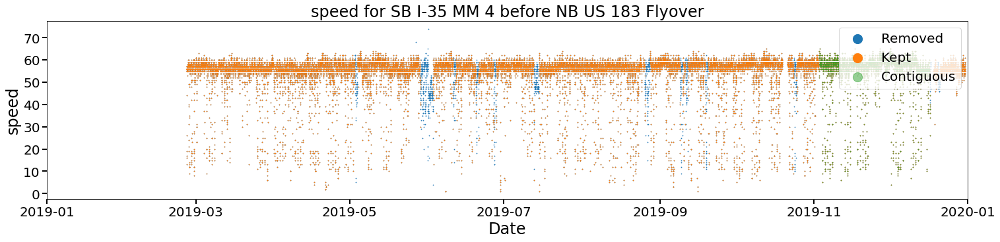

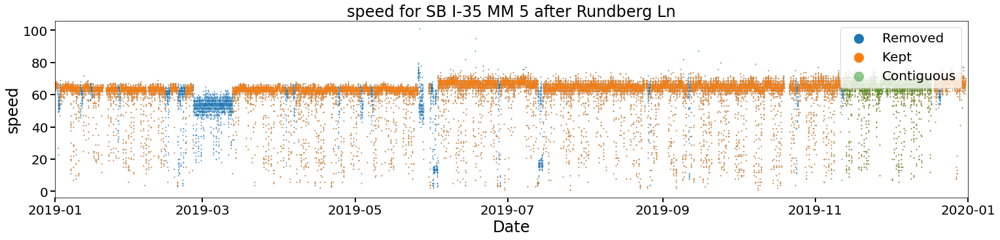

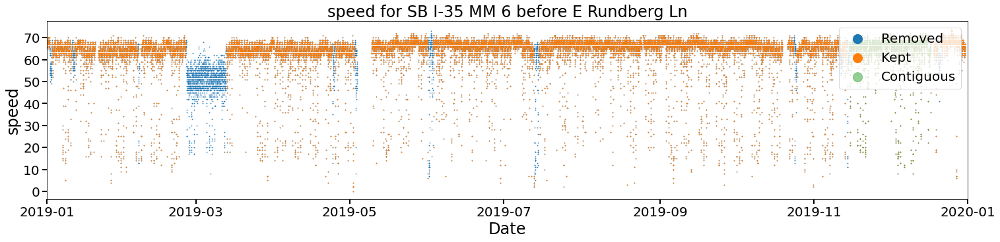

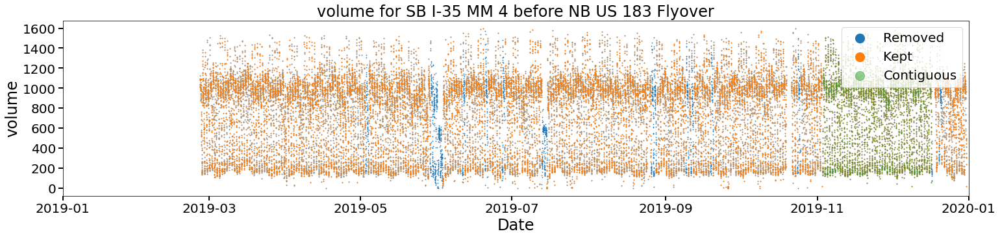

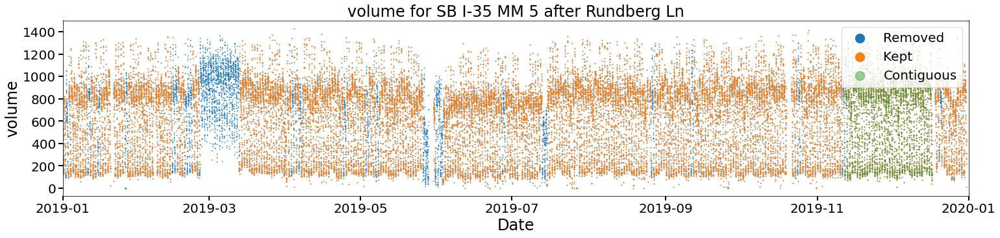

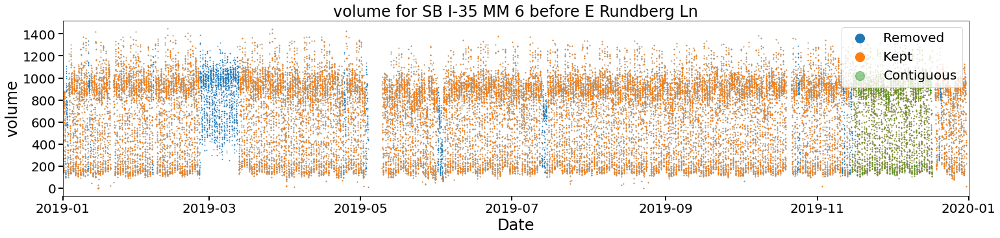

In [48]:
def plot_annual_cleaned(df, df_original, df_contig, sensor, field='speed'):
    plt.figure(figsize=[25,5])
    ax = plt.axes()
    ax.scatter(df_original.index, df_original[field], s=.5, label='Removed')
    ax.scatter(df.index, df[field], s=.5, label='Kept')
    ax.scatter(df_contig.index, df_contig[field], s=.5, alpha=.5, label='Contiguous')
    ax.set_xlabel('Date')
    ax.set_ylabel(field)
    ax.set_xlim([date(2019, 1, 1), date(2020, 1, 1)])
    ax.set_title(f'{field} for {sensor}')
    ax.title.set_size(24)
    ax.tick_params(axis='both', which='major')#, labelsize=24)
    ax.xaxis.label.set_size(24)
    ax.yaxis.label.set_size(24)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=7)
    plt.legend(loc=1, prop={'size': 20}, markerscale=20)
    plt.xticks(size = 20)
    plt.yticks(size = 20)

for i in range(len(dfs)):
    plot_annual_cleaned(dfs[i], dfs_original[i], dfs_contig[i], sensor_names[i])
for i in range(len(dfs)):
    plot_annual_cleaned(dfs[i], dfs_original[i], dfs_contig[i], sensor_names[i], 'volume')

# 4. Hypothesis testing

We used a t-test to evaluate our hypothesis that Friday peak hour speeds were significantly different compared to other weekdays. This consisted of 3 main steps:

1. Use `read_cleaned_data` to read the clean data created in section 2.
2. Use `perform_ttest` with starting hours, ending hours, sensor number and field to calculate the t-statistic and p-value.
3. If the p-value found is significantly lower than the alpha level of 0.05, reject the null hypothesis that Friday peak hour speeds are no different from other weekdays.

In [49]:
def read_cleaned_data(sensor_num: int, use_contiguous: bool = False, combine_holiday_and_weekend: bool = False):
    df = read_csv(f"derived_data/df{sensor_num}_cleaned{'_contig' if use_contiguous else ''}.csv", index_col=0, parse_dates=['Date'])
    df = df.dropna().resample('15T').mean()

    df['friday'] = df.index.dayofweek == 4

    dr = date_range(start='2019-01-01', end='2019-12-30')
    holidays = calendar().holidays(start=dr.min(), end=dr.max())

    holiday = df.index.normalize().isin(holidays)
    weekend = df.index.dayofweek > 4
    if combine_holiday_and_weekend:
        df['holiday_or_weekend'] = holiday | weekend
    else:
        df['holiday'] = holiday
        df['weekend'] = weekend

    return df.astype(float64)

def perform_ttest(sensor_num:int,starthour:int,endhour:int,alpha:int,field = 'speed'):
    df = read_cleaned_data(sensor_num, combine_holiday_and_weekend=True)
    df_weekday = df[(df["friday"] == 0) & (df["holiday_or_weekend"]==0)]
    df_friday = df[(df["friday"] == 1)]
    
    df_weekday = df_weekday.dropna()
    df_weekday["hour"] = df_weekday.index.hour

    df_friday = df_friday.dropna()
    df_friday["hour"] = df_friday.index.hour    
    
    df_weekday_morning = df_weekday[(df_weekday["hour"] > starthour) & (df_weekday["hour"] < endhour)]
    df_friday_morning = df_friday[(df_friday["hour"] > starthour) & (df_friday["hour"] < endhour)]
    
    #For the t-statistic, scipy documentation suggest using equal_var=False setting for inequal variances
    #When n1 != n2, the equal variance t-statistic is no longer equal to the unequal variance t-statistic
    #See https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.ttest_ind.html for reference
    
    results = ttest_ind(df_weekday_morning[field], df_friday_morning[field], equal_var = False)

    print("Unequal variance t-statistic for hypothesis testing, using samples of different size for sensor " + str(sensor_num))
    print("Aanalyzing the statistical significance of the time series " + str(field)+ " data starting from " + str(starthour) +"AM and ending at " + str(endhour) + "AM")
    print("The calculated t-statistic is " +str(round(results[0],4)))
    print("The two-tailed p-value is  " + str(results[1]))

    if float(results[1]) < alpha:
        print("We reject the null hypothesis that there's no difference between the means and conclude that a significant difference does exist.")
    
    elif float(results[1]) > alpha:
        print("We fail to reject the null hypothesis that there's no difference between the means and conclude that a significant difference does not exist.")
    return results

### Sensor 1

In [50]:
tstatresult = perform_ttest(sensor_num=1,starthour=5,endhour=10,alpha = 0.05,field = 'speed')

Unequal variance t-statistic for hypothesis testing, using samples of different size for sensor 1
Aanalyzing the statistical significance of the time series speed data starting from 5AM and ending at 10AM
The calculated t-statistic is -8.673
The two-tailed p-value is  1.4646315741239945e-17
We reject the null hypothesis that there's no difference between the means and conclude that a significant difference does exist.


In [51]:
tstatresult = perform_ttest(sensor_num=1,starthour=5,endhour=10,alpha = 0.05,field = 'volume')

Unequal variance t-statistic for hypothesis testing, using samples of different size for sensor 1
Aanalyzing the statistical significance of the time series volume data starting from 5AM and ending at 10AM
The calculated t-statistic is 3.567
The two-tailed p-value is  0.000377654535988046
We reject the null hypothesis that there's no difference between the means and conclude that a significant difference does exist.


### Sensor 2

In [52]:
tstatresult = perform_ttest(sensor_num=2,starthour=5,endhour=10,alpha = 0.05,field = 'speed')

Unequal variance t-statistic for hypothesis testing, using samples of different size for sensor 2
Aanalyzing the statistical significance of the time series speed data starting from 5AM and ending at 10AM
The calculated t-statistic is -9.188
The two-tailed p-value is  1.6771499510107493e-19
We reject the null hypothesis that there's no difference between the means and conclude that a significant difference does exist.


In [53]:
tstatresult = perform_ttest(sensor_num=2,starthour=5,endhour=10,alpha = 0.05,field = 'volume')

Unequal variance t-statistic for hypothesis testing, using samples of different size for sensor 2
Aanalyzing the statistical significance of the time series volume data starting from 5AM and ending at 10AM
The calculated t-statistic is 2.6745
The two-tailed p-value is  0.007585699888233044
We reject the null hypothesis that there's no difference between the means and conclude that a significant difference does exist.


### Sensor 3

In [54]:
tstatresult = perform_ttest(sensor_num=3,starthour=5,endhour=10,alpha = 0.05,field = 'speed')

Unequal variance t-statistic for hypothesis testing, using samples of different size for sensor 3
Aanalyzing the statistical significance of the time series speed data starting from 5AM and ending at 10AM
The calculated t-statistic is -9.8919
The two-tailed p-value is  2.4281373086785496e-22
We reject the null hypothesis that there's no difference between the means and conclude that a significant difference does exist.


In [55]:
tstatresult = perform_ttest(sensor_num=3,starthour=5,endhour=10,alpha = 0.05,field = 'volume')

Unequal variance t-statistic for hypothesis testing, using samples of different size for sensor 3
Aanalyzing the statistical significance of the time series volume data starting from 5AM and ending at 10AM
The calculated t-statistic is 1.6026
The two-tailed p-value is  0.10927104159904552
We fail to reject the null hypothesis that there's no difference between the means and conclude that a significant difference does not exist.


In conclusion, there is a significant difference in the speed data for Fridays vs other weekdays (Monday, Tuesday, Wednesday, and Thursday). 

However, for volume data, the statistical significance only exists for sensors 1 and 2 but not sensor 3. 

# 5. Modeling 

We tried several modeling approaches to see which had the best fit to the data: SARIMAX, polynomial regressions, and prophet. In this section, we compare our results using each method.

## 5.1 SARIMAX

Start by using this cell to specify the number of the sensor and the reading you want to model. Cleaned_data function was defined previously. 

In [56]:
sensor_num = 3
field = 'speed' # 'volume'

df = read_cleaned_data(sensor_num, combine_holiday_and_weekend=True)
df_contig = read_cleaned_data(sensor_num, True, True)
df.head()

,volume,speed,friday,holiday_or_weekend
Date,,,,
2019-01-01 00:00:00,213.0,66.0,0.0,1.0
2019-01-01 00:15:00,245.0,67.0,0.0,1.0
2019-01-01 00:30:00,340.0,66.0,0.0,1.0
2019-01-01 00:45:00,370.0,66.0,0.0,1.0
2019-01-01 01:00:00,350.0,67.0,0.0,1.0


### Test for stationarity

In [57]:
def test_adf(y, field='speed', diff=False):
    series = y[field]
    if diff:
        series = series.diff()
    dfout={}
    dftest=adfuller(series.dropna(), autolag='AIC', regression='ct')
    for key,val in dftest[4].items():
        dfout[f'critical value ({key})']=val
    if dftest[1]<=0.05:
        print("Reject null hypothesis - data is stationary")
        print(f"Data is stationary for {field}{' diff' if diff else ''}")
    else:
        print("Accept null hypothesis - data is not stationary")
        print(f"Data is NOT stationary for {field}{' diff' if diff else ''}")
    print('p value:', dftest[1])

test_adf(df, field=field)
test_adf(df, field=field, diff=True)

Reject null hypothesis - data is stationary
Data is stationary for speed
p value: 0.0
Reject null hypothesis - data is stationary
Data is stationary for speed diff
p value: 0.0


The data is stationary with high confidence ($p\ll 0.05$) so we're safe to use the subsetted contiguous data slice (and drop the full dataset from memory).

In [58]:
del df

### Check correleograms

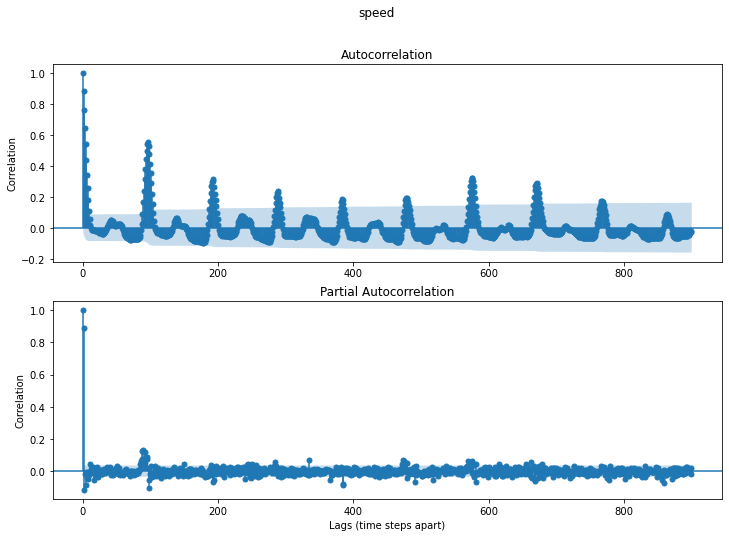

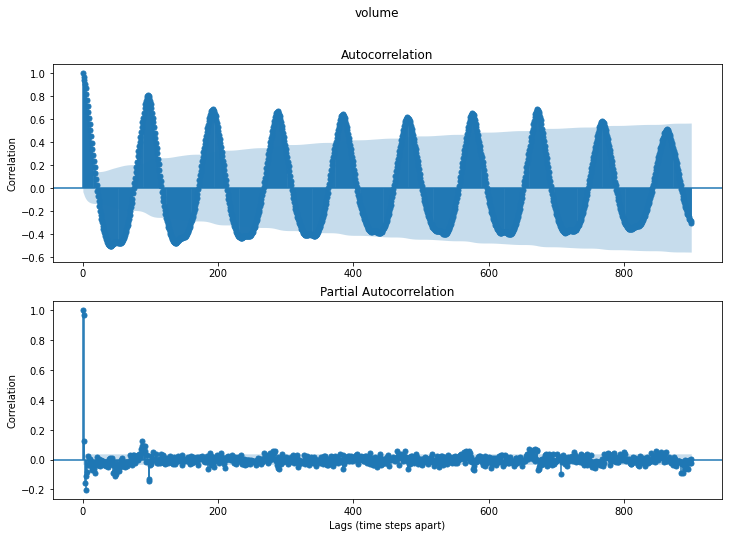

In [59]:
def plot_correleograms(df):
    for field in ('speed', 'volume'):
        fig,ax = plt.subplots(2,1, figsize=(12,8))
        fig.suptitle(field)
        fig = plot_acf(df[field].dropna(), lags=900, ax=ax[0])
        fig = plot_pacf(df[field].dropna(), lags=900, ax=ax[1])
        for i in range(2):
            ax[i].set_ylabel('Correlation')
        ax[1].set_xlabel('Lags (time steps apart)')
        plt.show()

plot_correleograms(df_contig)

We see the daily and weekly trends in both speed and volume. Daily spikes occur every 96 entries, or 1 reading every 15 minutes $\times$ 24 hours = 96, while weekly spikes occur every 7 $\times$ 96 = 672 entries.

Given the visible daily and weekly periodicity as well as the stationarity test results, we do our typical speed and volume analyses on a weekly basis.

First, let's remove holidays from our dataset (specifically US federal holidays). We'll make separate projections on these days, but we remove them because if a holiday falls on a weekday it won't be comparable to, say, a normal Monday.

### Format data for modeling

In [60]:
def format_data(df, field='speed', training_proportion=1., combine_holiday_and_weekend: bool = False):
    train_size = int(len(df.index) * training_proportion)
    
    if combine_holiday_and_weekend:
        X = df[['friday', 'holiday_or_weekend']]
    else:
        X = df[['friday','holiday','weekend']]

    y = df[[field]]
    X_train, y_train = X[:train_size], y[:train_size]
    X_test, y_test = X[train_size:], y[train_size:]
    return X_train, X_test, y_train, y_test

X, X_test, y, y_test = format_data(df_contig, field=field, training_proportion=0.9, combine_holiday_and_weekend=True)
# X, X_test, y, y_test = format_data(df, field=field, training_proportion=0.9, combine_holiday_and_weekend=True)
#y.plot(color='green', figsize=(25,5))
#plt.show()

### Fit SARIMAX models

#### Parameter selection and reasoning

Trend
* ADFuller tests show that the data is stationary, so we set the trend to None or 'n'.

Order
* p: Free choice. To keep the parameter count down we'll cap it at 2.
* d: ADFuller tests show that the data is stationary, so d=0.
* q: Free choice.

Seasonal order
* P: Free choice.
* D: ADFuller tests show that the data is stationary, so d=0.
* Q: Free choice.

Seasonal period (S)
* 96 since we have daily data in 15-min intervals, exogenously marked by day of week and holiday.

In [61]:
def fit_models(endog, exog, field='speed', save_directory='sarimax/sensor_1', combine_holiday_and_weekend: bool = False, order=2, verbose=True):
    results_raw = []

    # Construct list of pqPQ terms to test
    order += 1
    pqPQ = []
    for p in range(order):
        for q in range(order):
            for P in range(order):
                for Q in range(order):
                    pqPQ.append((p,q,P,Q))
    pqPQ.reverse() # reverse so bigger orders are tested first
    # Or override with your own
    pqPQ = [(1,2,1,2), (2,1,1,1), (2,2,1,2), (2,2,2,2)]

    for p, q, P, Q in pqPQ:
        # res_save_name = f'{save_directory}/{field}/{p}0{q}_{P}0{Q}_96.pkl'
        res_save_name = f'{save_directory}/{field}/contig_.9/{p}0{q}_{P}0{Q}_96.pkl'

        # Load completed run if it exists
        fitted = None
        try:
            fitted = load_pickle(res_save_name)
            if verbose:
                print('Loaded', (p,q,P,Q))
        except FileNotFoundError:
            if verbose:
                print('Running', (p,q,P,Q))
            t0 = time()
            model = ARIMA(endog=y, exog=X, freq='15T', order=(p, 0, q), seasonal_order=(P, 0, Q, 96), trend='n')
            # model.initialize_approximate_diffuse()
            fitted = model.fit(low_memory=True)#, method='innovations_mle')
            fitted.save(res_save_name)
            if verbose:
                print('Elapsed:', time()-t0)
                print(fitted.summary())

        res = {}
        res['p'] = p
        res['q'] = q
        res['P'] = P
        res['Q'] = Q
        res['BIC'] = fitted.bic
        res['p_friday'] = fitted.pvalues['friday']
        if combine_holiday_and_weekend:
            res['p_holiday_or_weekend'] = fitted.pvalues['holiday_or_weekend']
        else:
            res['p_weekend'] = fitted.pvalues['weekend']
            res['p_holiday'] = fitted.pvalues['holiday']
        results_raw.append(Series(res, name=str((p,q,P,Q))))
    return concat(results_raw, axis=1).T

df_res = fit_models(y, X, field=field, save_directory=f'sarimax/sensor_{sensor_num}', combine_holiday_and_weekend=True, verbose=True)
df_res

Loaded (1, 2, 1, 2)
Loaded (2, 1, 1, 1)
Loaded (2, 2, 1, 2)
Loaded (2, 2, 2, 2)


C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:1354: RuntimeWarning: invalid value encountered in sqrt
  bse_ = np.sqrt(np.diag(self.cov_params()))


,p,q,P,Q,BIC,p_friday,p_holiday_or_weekend
"(1, 2, 1, 2)",1.0,2.0,1.0,2.0,15557.038865,3.054488e-01,1.847682e-01
"(2, 1, 1, 1)",2.0,1.0,1.0,1.0,15582.220046,3.441104e-01,1.924854e-01
"(2, 2, 1, 2)",2.0,2.0,1.0,2.0,15390.939504,4.208973e-08,8.319433e-08
"(2, 2, 2, 2)",2.0,2.0,2.0,2.0,15601.706597,NaN,4.626381e-03


Visualize the performance of one of the best models compared to the withheld test set.

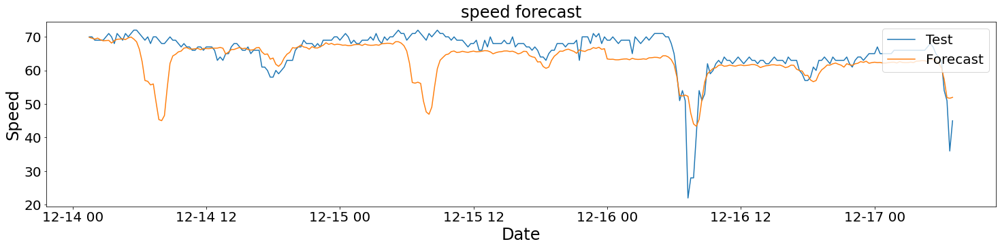

In [62]:
def compare_forecast(model, y_test, X_test, field):
    y_fcast = model.predict(start=y_test.index[0], end=y_test.index[-1], dynamic=True, exog = X_test)
  
    plt.figure(figsize=(25, 5))
    plt.title(f'{field} forecast', fontsize =24)
    plt.plot(y_test, label='Test')
    plt.plot(y_fcast, label='Forecast')
    plt.legend(loc=1, prop={'size': 20}, markerscale=20)
    plt.ylabel("Speed", fontsize=24)
    plt.xlabel("Date", fontsize=24)
    plt.xticks(size = 20)
    plt.yticks(size = 20)
    plt.show()
    
compare_forecast(load_pickle('sarimax/sensor_3/speed/contig_.9/202_102_96.pkl'), y_test, X_test, field)

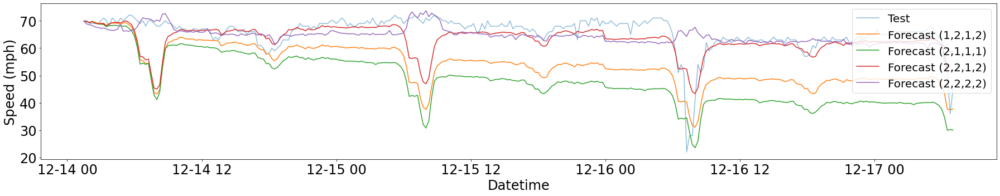

In [63]:
def compare_multiple(y_test, pqPQ):
    plt.figure(figsize=(25, 5))
    plt.plot(y_test, alpha=.5, label='Test')
    for p,q,P,Q in pqPQ:
        model = load_pickle(f'sarimax/sensor_3/speed/contig_.9/{p}0{q}_{P}0{Q}_96.pkl')
        # print((p,q,P,Q), 'BIC', model.bic)
        y_fcast = model.predict(start=y_test.index[0], end=y_test.index[-1], dynamic=True, exog = X_test)
        plt.ylabel('Speed (mph)',fontsize=24)
        plt.xlabel('Datetime',fontsize=24)
        plt.plot(y_fcast, label=f'Forecast ({p},{q},{P},{Q})')
    plt.legend(loc=1, prop={'size': 20}, markerscale=20)
    plt.xticks(size = 24)
    plt.yticks(size = 24)
    plt.tight_layout()
    plt.show()

compare_multiple(y_test, [(1,2,1,2), (2,1,1,1), (2,2,1,2), (2,2,2,2)])

## 5.2 Polynomial curve-fitting to the data

We already generated the cleaned datasets as DataFrames. Below we make some small adjustments to these datasets to use them for regressions.

In [64]:
dfs[0].columns = ['Volume-Sensor1', 'Speed-Sensor1']
dfs[1].columns = ['Volume-Sensor2', 'Speed-Sensor2']
dfs[2].columns = ['Volume-Sensor3', 'Speed-Sensor3']

result=result = pd.concat([dfs[0], dfs[1],dfs[2]], axis=1, sort=False)
result = result.dropna()
result = result.reset_index()

result['dayOfWeek'] = result['Date'].dt.day_name() 
result["Hour"] = result['Date'].dt.hour
result["Minute"] = result['Date'].dt.minute

result.index= result['Date']
result = result.asfreq('15min')

`format_data` is used to create 4 different regression functions. In prior sections, we have seen that the slowdowns were mostly between 6AM to 10AM. To make sure that we capture the whole behavior, we analyze the datasets from 4AM to 11AM, where we have a decline in speed from 4AM to 7AM and a recovery from 7AM to 11AM. Hence, `weekdays_1` and `friday_1` are the averaged daily datasets from 4AM to 7AM for weekdays and Fridays, respectively. Similarly, `weekdays_2` and `friday_2` are the averaged daily datasets from 7AM to 11AM for weekdays and Fridays, respectively.

In [65]:
def format_data(dataframe, filt, hourstart,hourend):
    data = dataframe[dataframe["Hour"] >hourstart]
    data = data[data["Hour"] <hourend]
    if filt == "MTWTH":
        data = data[(data["dayOfWeek"] == "Monday") | (data["dayOfWeek"] == "Tuesday") | (data["dayOfWeek"] == "Wednesday") | (data["dayOfWeek"] == "Thursday")]
    elif filt == "F":
        data = data[(data["dayOfWeek"] == "Friday")]
        
    data["number"] = data["Hour"]*100 + data["Minute"]
    data = data.groupby(['number']).mean()
    data = data.reset_index()
    return data

weekdays_1 = format_data(result,filt ='MTWTH', hourstart = 4,hourend=7)
weekdays_2 = format_data(result,filt ='MTWTH', hourstart = 7,hourend=11)
friday_1 = format_data(result,filt ='F', hourstart = 4,hourend=7)
friday_2 = format_data(result,filt ='F', hourstart = 7,hourend=11)

We define a simple function below, using an objective of third degree polynomial fit. It returns 4 constants $(a, b, c, d)$ which are the numbers from the objective for the corresponding polynomial regression equation: $ax^3 + bx^2 + c^x + d$

In [66]:
def fit_curve(dataframe = weekdays_1, sensor = "Speed-Sensor1", title="weekdays"):
    
    # define the true objective function
    def objective(x,a,b,c,d):
            return a*x**3 + b*x**2 + c*x + d
    
    # fit a straight line to the economic data   
    x = dataframe["number"].values
    y = dataframe["Speed-Sensor1"].values

    # curve fit
    popt, _ = curve_fit(objective, x, y)
    # summarize the parameter values
    a,b,c,d= popt
    print('y =  %.4f * x**3 + %.4f * x**2 + %.4f * x + %.4f  ' % (a, b, c,d))
    # plot input vs output
    plt.scatter(x, y, label="measured")
    # define a sequence of inputs between the smallest and largest known inputs
    x_line = arange(min(x), max(x)+5, 5)
    # calculate the output for the range
    y_line = objective(x_line,a,b,c,d)
    # create a line plot for the mapping function
    plt.plot(x_line, y_line, '--', color='red',label="predicted")
    plt.xlabel('time (HHMM)')
    plt.ylabel('speed (mph)')
    plt.title(sensor + ' '+ title)
    plt.legend()
    plt.show()
    return a,b,c,d

Here, visuals are generated for various sensors, for their decline and recovery time periods in the mornings.

y =  -0.0000 * x**3 + 0.0159 * x**2 + -8.5335 * x + 1592.7371  


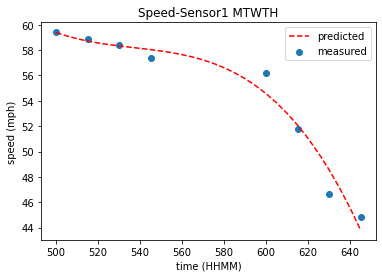

In [67]:
a1,b1,c1,d1 = fit_curve(dataframe = weekdays_1,sensor = "Speed-Sensor1", title = "MTWTH")

y =  -0.0000 * x**3 + 0.0159 * x**2 + -8.5335 * x + 1592.7371  


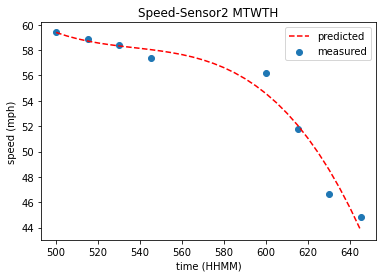

In [68]:
a2,b2,c2,d2 = fit_curve(dataframe = weekdays_1,sensor = "Speed-Sensor2", title = "MTWTH")

y =  -0.0000 * x**3 + 0.0159 * x**2 + -8.5335 * x + 1592.7371  


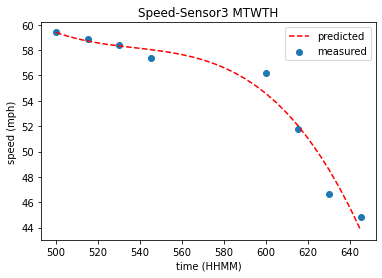

In [69]:
a3,b3,c3,d3 = fit_curve(dataframe = weekdays_1,sensor = "Speed-Sensor3", title = "MTWTH")

y =  -0.0000 * x**3 + 0.0233 * x**2 + -21.0570 * x + 6301.6554  


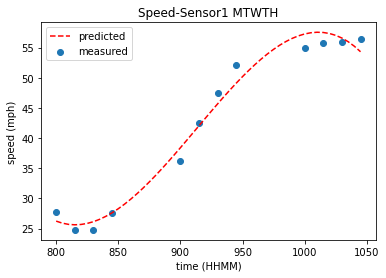

In [70]:
a1_2,b1_2,c1_2,d1_2 = fit_curve(dataframe = weekdays_2,sensor = "Speed-Sensor1", title = "MTWTH")

y =  -0.0000 * x**3 + 0.0233 * x**2 + -21.0570 * x + 6301.6554  


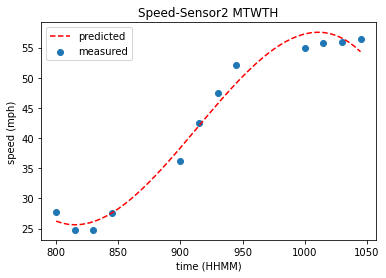

In [71]:
a2_2,b2_2,c2_2,d2_2 = fit_curve(dataframe = weekdays_2,sensor = "Speed-Sensor2", title = "MTWTH")

y =  -0.0000 * x**3 + 0.0233 * x**2 + -21.0570 * x + 6301.6554  


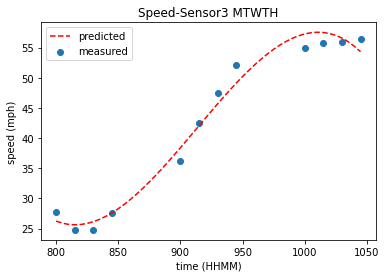

In [72]:
a3_2,b3_2,c3_2,d3_2 = fit_curve(dataframe = weekdays_2,sensor = "Speed-Sensor3", title = "MTWTH")

y =  -0.0000 * x**3 + 0.0133 * x**2 + -7.1205 * x + 1333.3914  


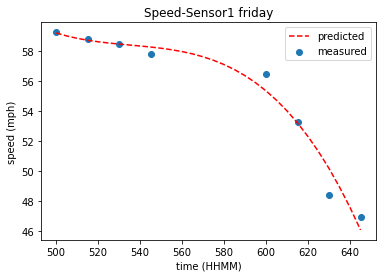

In [73]:
a4,b4,c4,d4 = fit_curve(dataframe = friday_1,sensor = "Speed-Sensor1", title = "friday")

y =  -0.0000 * x**3 + 0.0133 * x**2 + -7.1205 * x + 1333.3914  


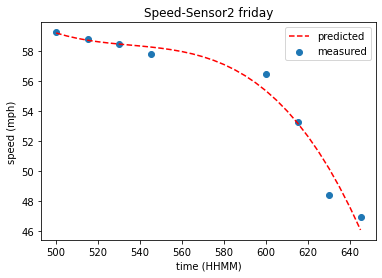

In [74]:
a5,b5,c5,d5 = fit_curve(dataframe = friday_1,sensor = "Speed-Sensor2", title = "friday")

y =  -0.0000 * x**3 + 0.0133 * x**2 + -7.1205 * x + 1333.3914  


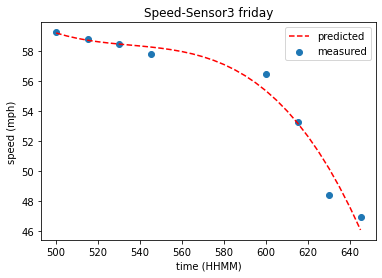

In [75]:
a6,b6,c6,d6 = fit_curve(dataframe = friday_1,sensor = "Speed-Sensor3", title = "friday")

y =  -0.0000 * x**3 + 0.0011 * x**2 + -0.4237 * x + -21.0874  


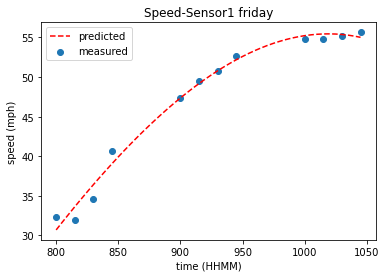

In [76]:
a4_2,b4_2,c4_2,d4_2 = fit_curve(dataframe = friday_2,sensor = "Speed-Sensor1", title = "friday")

y =  -0.0000 * x**3 + 0.0011 * x**2 + -0.4237 * x + -21.0874  


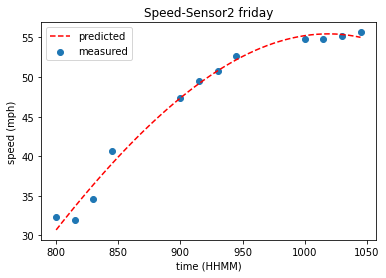

In [77]:
a5_2,b5_2,c5_2,d5_2 = fit_curve(dataframe = friday_2,sensor = "Speed-Sensor2", title = "friday")

y =  -0.0000 * x**3 + 0.0011 * x**2 + -0.4237 * x + -21.0874  


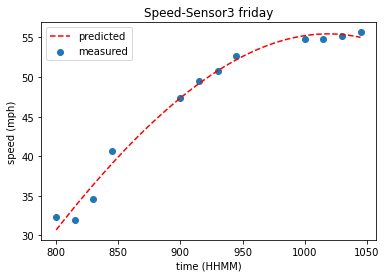

In [78]:
a6_2,b6_2,c6_2,d6_2 = fit_curve(dataframe = friday_2,sensor = "Speed-Sensor3", title = "friday")

Above, various constants were generated for various sensor locations and different time frames. 

For example: 16 contants were generated for sensor 1. We have

* a1, b1, c1, and d1 fit Monday through Thursday from 4AM to 7AM 
* a1_2, b1_2, c1_2, and d1_2 fit Monday through Thursday from 7AM to 11AM
* a4, b4, c4, and d4 fit Fridays 4AM to 7AM
* a4_2, b4_2, c4_2, and d4_2 fit Fridays 7AM to 11AM

Hence, for one sensor, we have 16 constants. These are combined for each sensor seperately to be able to automate predictions. 

In [79]:
constantsensor1 = [a1,b1,c1,d1,a1_2,b1_2,c1_2,d1_2,a4,b4,c4,d4,a4_2,b4_2,c4_2,d4_2]
constantsensor2 = [a2,b2,c2,d2,a2_2,b2_2,c2_2,d2_2,a5,b5,c5,d5,a5_2,b5_2,c5_2,d5_2]
constantsensor3 = [a3,b3,c3,d3,a3_2,b3_2,c3_2,d3_2,a6,b6,c6,d6,a6_2,b6_2,c6_2,d6_2]

Using these constants obtained from the above regressor we can now generate a speed prediction function. In this function, a new DataFrame is generated from 03.01.2019 to 12.30.2020 as the time-series dataframe. All the speed values are calculated automatically according to the information that was learned and mapped into the various constants. By providing a sensor number, together with the speed limit in the area: we can get a pretty good accuracy on the speed data.

In summary, the predictor is using the below information in calcuations: 

### Rules for speed prediction

Speed ~ speed limit for weekends & holidays

Speed ~ speed limit for weekdays, non-rush hours (before 5am, after 11am)

Speed ~ two different polynomial regression fits (MTWTh & F) for rush hours

In [80]:
def predictionofspeed (speedlimit, sensornumber=1):

    if sensornumber == 1:
        constants = constantsensor1
    elif sensornumber == 2:
        constants = constantsensor2
    elif sensornumber == 3:
        constants = constantsensor3
    
    a,b,c,d, aa,bb,cc,dd, a_f,b_f,c_f,d_f,aa_f,bb_f,cc_f,dd_f = constants
    averagespeed = speedlimit*0.95
    
    #Create a new dataset for predictions
    dr = pd.date_range(start='2019-03-01', end='2019-12-30')
    df = pd.DataFrame(index=dr)
    df = df.asfreq('15min')
    df = df.reset_index()
    df["Speed"] = averagespeed
    df["Hour"] = df["index"].dt.hour
    df["Minute"] = df["index"].dt.minute
    df["number"] = df["Hour"]*100 + df["Minute"]

    cal = calendar()
    holidays = cal.holidays(start=dr.min(), end=dr.max())

    df['dayOfWeek'] = df['index'].dt.day_name() 
    df['holiday'] = df['index'].dt.date.astype('datetime64').isin(holidays).astype(int)
    df['weekend']  = ((pd.DatetimeIndex(df['index']).dayofweek) // 5 == 1).astype(int)
    df.set_index('index')
    
    speed = []
    speeddata = []
    i = 0

    holiday = df['holiday']
    weekend = df['weekend']
    number = df["number"]
    hour = df["Hour"] 
    dayOfWeek = df['dayOfWeek']

    while i<len(df):
        if ((dayOfWeek[i] != 'Friday') and (holiday[i] ==0) and (weekend[i] ==0) and (4<hour[i]<11)):
            if (4 < hour[i] < 7):
                speed = a*number[i]**3 + b*number[i]**2 + c*number[i] + d
            elif (7 < hour[i] < 11):
                speed = aa*number[i]**3 + bb*number[i]**2 + cc*number[i] + dd
        elif ((dayOfWeek[i] == 'Friday') and (holiday[i] ==0) and (weekend[i] ==0) and (4<hour[i]<11)):
            if (4 < hour[i] < 7):
                speed = a_f*number[i]**3 + b_f*number[i]**2 + c_f*number[i] + d_f
            elif (7 < hour[i] < 11):
                speed = aa_f*number[i]**3 + bb_f*number[i]**2 + cc_f*number[i] + dd_f
        else:
            speed = averagespeed
        speeddata.append(speed)
        i = i+1

    df["Speed"] = speeddata
    return df

Below is an example of how to use this to generate a predicted dataframe for sensor1

In [81]:
# Prediction for sensor #1
predicted1 = predictionofspeed(speedlimit = 60,sensornumber=1)

Similarly, below is an example of how to use this to generate a predicted dataframe for sensor2

In [82]:
# Prediction for sensor #2
predicted2 = predictionofspeed(speedlimit = 70,sensornumber=2)

We visualize the generated prediction dataframe and compare it with the measurement obtained from Sensor 1:

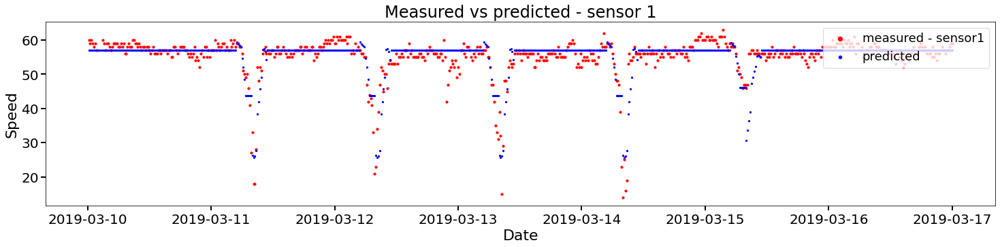

In [83]:
df1= dfs[0].reset_index()

start_date = '2019-03-10 00:00:00'
end_date = '2019-03-17 00:00:00'

mask1 = (df1['Date'] > start_date) & (df1['Date'] <= end_date)
mask2 = (predicted1['index'] > start_date) & (predicted1['index'] <= end_date)

ax1 = df1.loc[mask1].plot.scatter(figsize = [25,5], x= 'Date', y="Speed-Sensor1", label="measured - sensor1", color="red", s=10)
predicted1.loc[mask2].plot.scatter(x = "index" , y = "Speed", label = "predicted",color="blue" ,s=5,ax=ax1)
ax1.set_title('Measured vs predicted - sensor 1')
ax1.tick_params(axis='both', which='major')
ax1.set_xlabel('Date')
ax1.set_ylabel('Speed')
ax1.title.set_size(24)
ax1.xaxis.label.set_size(22)
ax1.yaxis.label.set_size(22)
plt.legend(loc=1, prop={'size': 18}, markerscale=2)
ax1.tick_params(which='both', width=2)
ax1.tick_params(which='major', length=7)

plt.xticks(size =20)
plt.yticks(size =20)
plt.show()

We can also visualize the generated prediction dataframe and compare it with the measurement obtained from Sensor 2:

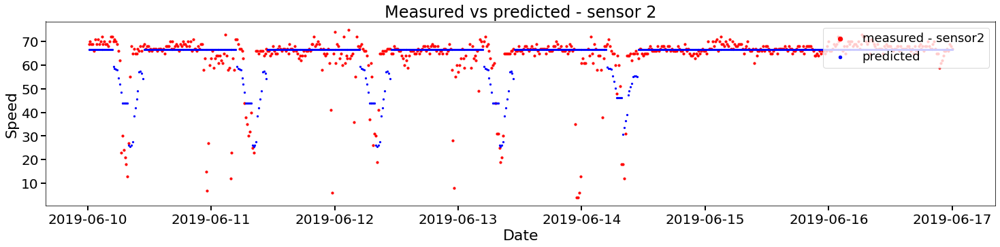

In [84]:
df2= dfs[1].reset_index()

start_date = '2019-06-10 00:00:00'
end_date = '2019-06-17 00:00:00'

mask1 = (df2['Date'] > start_date) & (df2['Date'] <= end_date)
mask2 = (predicted2['index'] > start_date) & (predicted2['index'] <= end_date)

ax1 = df2.loc[mask1].plot.scatter(figsize = [25,5], x= 'Date', y="Speed-Sensor2", label="measured - sensor2", color="red", s=10)
predicted2.loc[mask2].plot.scatter(x = "index" , y = "Speed", label = "predicted",color="blue" ,s=5,ax=ax1)
ax1.set_title('Measured vs predicted - sensor 2')
ax1.set_xlabel('Date')
ax1.set_ylabel('Speed')
ax1.title.set_size(24)
ax1.xaxis.label.set_size(22)
ax1.yaxis.label.set_size(22)
plt.legend(loc=1, prop={'size': 18}, markerscale=2)
ax1.tick_params(which='both', width=2)
ax1.tick_params(which='major', length=7)

plt.xticks(size = 20)
plt.yticks(size = 20)
plt.show()

Even though this approach provides a good fit for speed modeling and making the approach as coarse as possible, we are not able to use this for volume data modeling. Hence, prophet approach was tried to model both speed and volume data from all three sensors, which in the following section. 

## 5.3 Prophet

Start by specifying which sensor you want to analyze and what data field to model, as well as whether we want to include weekends in the model.

In [85]:
sensor_num = 3
field = 'speed'
delete_weekends = True

Read in the previously cleaned data.

In [86]:
def read_cleaned_data(sensor_num: int, delete_weekends: bool = True):
    df = read_csv(f"derived_data/df{sensor_num}_cleaned.csv", index_col=0, parse_dates=['Date'])
    df = df.dropna().resample('15T').mean()

    if delete_weekends:
        df[df.index.dayofweek > 4] = nan

    return df

df = read_cleaned_data(sensor_num, delete_weekends=delete_weekends)
df.head()

,volume,speed
Date,,
2019-01-01 00:00:00,213.0,66.0
2019-01-01 00:15:00,245.0,67.0
2019-01-01 00:30:00,340.0,66.0
2019-01-01 00:45:00,370.0,66.0
2019-01-01 01:00:00,350.0,67.0


In [87]:
def format_data(df, field='speed', training_proportion=1., delete_weekends=True):
    train_size = int(len(df.index) * training_proportion)

    df_subset = df[[field]].reset_index()
    df_subset.rename(columns={'Date': 'ds', field: 'y'}, inplace=True)
    df_train = df_subset[:train_size]
    df_test = df_subset[train_size:]
    df_test = df_test.dropna()

    return df_train, df_test

df_train, df_test = format_data(df, field=field, training_proportion=0.8, delete_weekends=delete_weekends)
df_train.head()

,ds,y
0,2019-01-01 00:00:00,66.0
1,2019-01-01 00:15:00,67.0
2,2019-01-01 00:30:00,66.0
3,2019-01-01 00:45:00,66.0
4,2019-01-01 01:00:00,67.0


In [88]:
%%time
m = Prophet(changepoint_prior_scale=0.001, yearly_seasonality=False)
m.add_country_holidays(country_name='US')
m.fit(df_train)

Wall time: 9.45 s


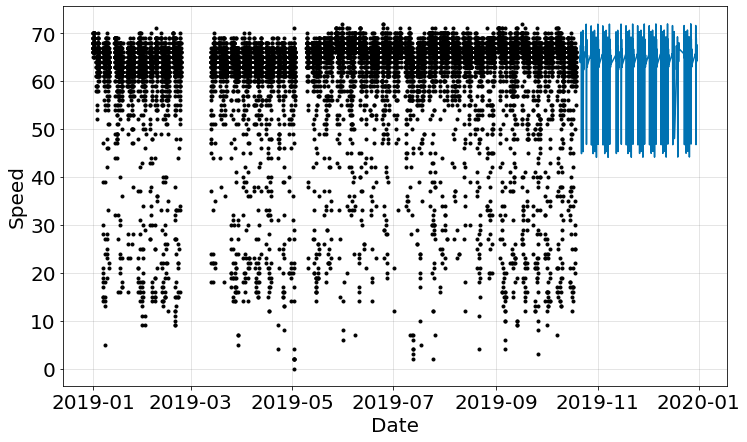

In [89]:
df_forecast = m.predict(df_test)
fig1 = m.plot(df_forecast, uncertainty=False)
plt.xticks(size = 20)
plt.yticks(size = 20)
plt.xlabel("Date",fontsize = 20)
plt.ylabel("Speed",fontsize = 20)
plt.show()

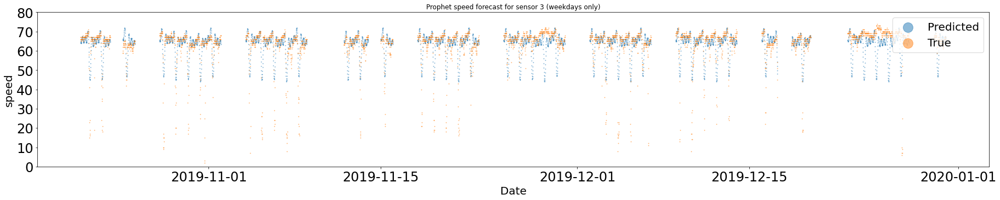

In [90]:
plt.figure(figsize=(25,5))
plt.scatter(df_forecast['ds'], df_forecast['yhat'], s=.8, alpha=.5, label='Predicted')
plt.scatter(df_test['ds'], df_test['y'], s=.8, alpha=.5, label='True')
plt.ylim((0,80) if field=='speed' else (0,1700))
plt.xlabel('Date',fontsize = 20)
plt.ylabel(field,fontsize = 20)
plt.title(f'Prophet {field} forecast for sensor {sensor_num}{" (weekdays only)" if delete_weekends else ""}')
plt.legend()
plt.tight_layout()
plt.xticks(size = 24)
plt.yticks(size = 24)
plt.legend(loc=1, prop={'size': 20}, markerscale=20)
plt.show()

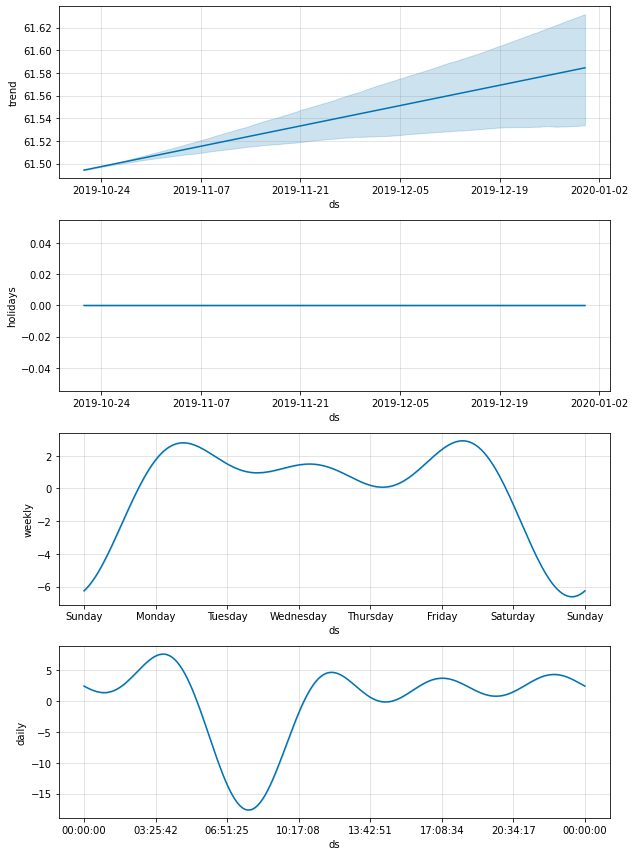

In [91]:
m.plot_components(df_forecast)
plt.show()

## 5.4 Mean Forecasting

In [92]:
sensor = 'SB I-35 MM 6 before E Rundberg Ln'
        # 'SB I-35 MM 4 before NB US 183 Flyover'
        # 'SB I-35 MM 5 after Rundberg Ln'
        # 'SB I-35 MM 6 before E Rundberg Ln'
speed_limit = 70 # 60 for 183, 70 for others

In [93]:
def read_data(sensor_name: str):
    sensor_names = (
        'SB I-35 MM 4 before NB US 183 Flyover',
        'SB I-35 MM 5 after Rundberg Ln',
        'SB I-35 MM 6 before E Rundberg Ln'
    )
    sensor_num = sensor_names.index(sensor_name) + 1
    df = read_csv(f'derived_data/df{sensor_num}.csv', index_col=0, parse_dates=True)
    return df

def remove_outliers(df_to_filter: DataFrame, speed_limit: float):
    df = df_to_filter.copy()

    # 5mph high filter
    print(f'# readings before filtering: {len(df.index)}')
    df.drop(df.index[df['speed'] > speed_limit + 5], inplace=True)
    print(f'           after max filter: {len(df.index)}')

    # 10mph low filter
    dates_to_delete = []

    # group by day
    for timestamp, day in df.groupby(df.index.floor('d')):

        # Grab speeds outside of peak hours
        speeds_off_peak = day.loc[(day.index.hour < 5) | (day.index.hour >= 11), 'speed']

        # Find the proportion of speeds that are less than the speed limit minus 5mph
        p = (speeds_off_peak <= speed_limit - 10).sum() / speeds_off_peak.shape[0]

        # If the proportion is more than 25%, prepare to delete the entire day from the data
        if p > .25:
            dates_to_delete.append(timestamp.date())

    # Delete the days marked for deletion
    for date_to_delete in dates_to_delete:
        df.drop(df.index[df.index.date == date_to_delete], inplace=True)
    print(f'           after max filter: {len(df)}')

    return df

df = read_data(sensor)
df_filtered = remove_outliers(df, speed_limit)


# readings before filtering: 33652
           after max filter: 33652
           after max filter: 30933


Based on the eye test, our outlier rules appear to be properly identifying odd days in the dataset.

In [94]:
def split_holiday(df):

    # Filter out holidays
    holidays = calendar().holidays(start=df.index.min(), end=df.index.max())
    holidays = df.index.normalize().isin(holidays)
    df_hl = df[holidays]
    df_rest = df[~holidays]

    return df_rest, df_hl

df_rest, df_hl = split_holiday(df_filtered)
df_rest.head()

,volume,speed
Date,,
2019-01-03 00:00:00,231,67
2019-01-03 00:15:00,199,65
2019-01-03 00:30:00,159,63
2019-01-03 00:45:00,151,61
2019-01-03 01:00:00,134,64


Based on a hypothesis test performed in Section 4, we found that the speed trend on Friday is significantly different from Monday through Thursday, so we separate out Fridays and weekends, along with bucketing Monday through Thursday together.

In [95]:
def split_weekdays(df):
    
    # Split non-holiday into M-Th, F, weekend
    df_mt = df[df.index.dayofweek < 4]
    df_fr = df[df.index.dayofweek == 4]
    df_wn = df[df.index.dayofweek > 4]

    return df_mt, df_fr, df_wn

df_mt, df_fr, df_wn = split_weekdays(df_filtered)
df_mt.head()

,volume,speed
Date,,
2019-01-01 00:00:00,213,66
2019-01-01 00:15:00,245,67
2019-01-01 00:30:00,340,66
2019-01-01 00:45:00,370,66
2019-01-01 01:00:00,350,67


We build our typical trend line by averaging the speed and volume trend across all (non-holiday) Mondays-Thursday and using that (repeated four times) as our trend for typical Mondays, Tuesdays, Wednesdays, and Thursdays; averaging Fridays for a typical Friday; and weekends for Saturday and Sunday.

The output will be a weekly forecast, indexed by the number of 15-minute intervals from that week's Monday at midnight.

In [96]:
def create_prediction(df_mt, df_fr, df_wn):    

    # Find average values for every day
    df_mt_mean = df_mt.groupby(df_mt.index.time).mean()
    df_fr_mean = df_fr.groupby(df_fr.index.time).mean()
    df_wn_mean = df_wn.groupby(df_wn.index.time).mean()

    return concat([df_mt_mean]*4+[df_fr_mean]+[df_wn_mean]*2, axis=0).reset_index(drop=True)

df_predict = create_prediction(df_mt, df_fr, df_wn)
df_predict.head()

,volume,speed
0,218.102703,66.156757
1,204.880435,66.282609
2,187.918033,66.448087
3,175.222826,66.288043
4,160.326087,66.304348


Finally, let's check how well the mean forecast does compared to the observations we took the mean against.

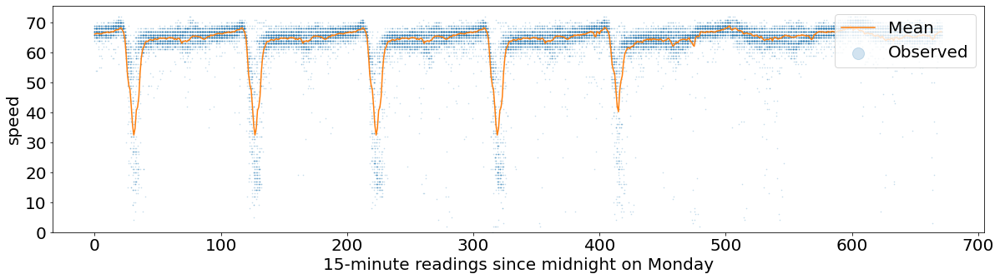

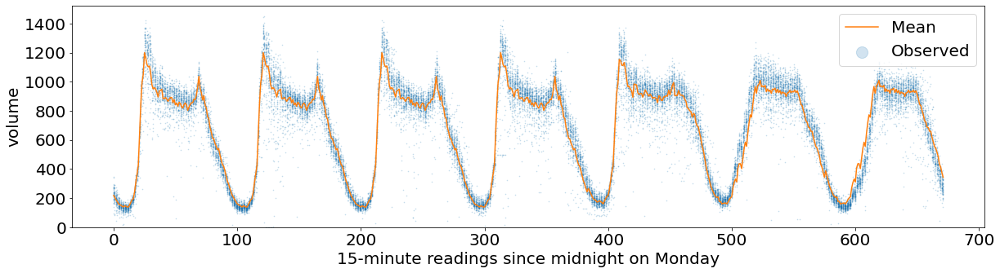

In [97]:
def plot_data(df, df_predict, field='speed', holiday=False):
    fig, ax = plt.subplots(figsize=(20,5))
    if holiday:
        normalized = (df.index - df.index.normalize()).to_series().astype('timedelta64[s]')
    else:
        start_of_week = (df.index - to_timedelta(df.index.weekday, unit='D')).normalize()
        normalized = (df.index - start_of_week).to_series().astype('timedelta64[s]')
    plt.scatter(normalized.index.total_seconds()/60/15, df[field], s=.5, alpha=.2, label='Observed')
    plt.plot(df_predict[field], c='#ff7f0e', label='Mean')
    plt.ylim(0)
    plt.xlabel(f'15-minute readings since midnight on {"a holiday" if holiday else "Monday"}',fontsize = 20)
    plt.ylabel(field,fontsize = 20)
    plt.legend()
    plt.xticks(size = 20)
    plt.yticks(size = 20)
    plt.legend(loc=1, prop={'size': 20}, markerscale=20)
    plt.show()
    
for field in ('speed', 'volume'):
    plot_data(df_rest, df_predict, field)

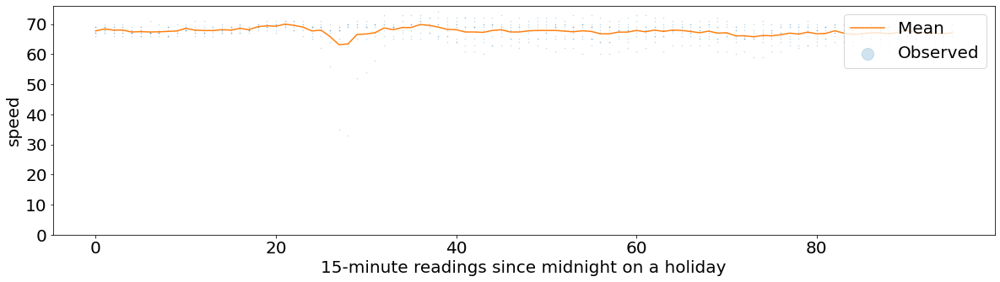

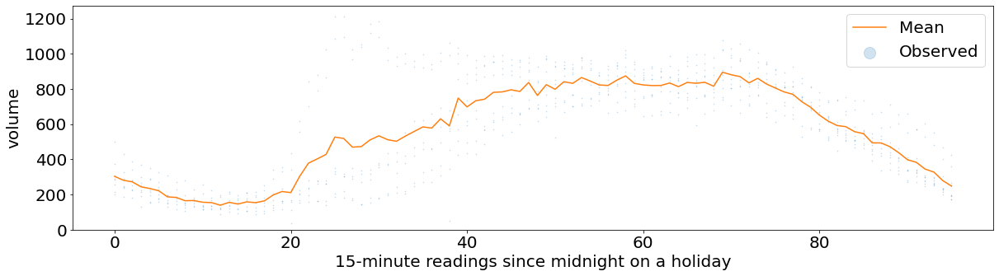

In [98]:
def create_prediction_holiday(df_hl):
    return df_hl.groupby(df_hl.index.time).mean().reset_index(drop=True)

df_hl_predict = create_prediction_holiday(df_hl)
for field in ('speed', 'volume'):
    plot_data(df_hl, df_hl_predict, field, holiday=True)
    

# Conclusions

To accomplish the goal of providing typical speeds for every 15-minute interval in a year, we ended up trying four different methods for finding trends in time series data, with mixed results.
1. ARIMA is the most generally accepted time series model, providing p-values on coefficients so we could evaluate model choices for significance, but we found that it took a very, very long time to fit (accounting for most of our delay), making testing the ideal set of parameters to the ARIMA model difficult. It also struggled with properly modeling weekend speeds even when provided additional context.
2. A simple rule-based regression model had good fit, but does not take into account the time series information of our dataset and doesn't provide evaluation scores (other than RMSE against a withheld test dataset) and doesn't perform as well on volume.
3. Prophet, a recently developed time series algorithm, does take into account time series relationships and multiple periodicities (and fits very quickly), but also doesn't provide scores to test against and also struggles with weekend speeds.
4. A simple mean across all 8 AM, 8:15 AM readings, etc, bucketed into M-Th, Friday, weekends, and holidays. Like many other methods, this doesn't provide likeliness scores or p-values, but we observed that this model was able to capture the shape of the data in a way that the other models couldn't.

Per the deliverable we established when we started the project,this is a self-contained notebook that implements model 4 to create our "typical" speeds and volumes for every 15 minute interval in a year.